In [1]:
import pandas as pd
import numpy as np
import os
import time
import pickle
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
import itertools
import seaborn as sns
from sklearn.decomposition import PCA
from scipy.spatial import distance
from scipy.cluster import hierarchy
from itertools import combinations
import umap
import networkx as nx
%run s7_0_functions_for_data_preprocessing_for_ml.ipynb
os.environ["NUMBA_WARNINGS"] = "1"

os.chdir(os.getcwd())
os.getcwd()
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
#warnings.simplefilter(action="ignore", category=pd.errors.SettingWithCopyWarning)
#warnings.simplefilter(action="ignore", category=DeprecationWarning)

#from itables import init_notebook_mode
#init_notebook_mode(all_interactive=True)

# PLOT PCAs USING VARIABLE AVAILABILITY (TRUE/FALSE) OF PATIENTS 

## PCA and Clustermap of dataframe containing the available variables (1:yes,0:no) for each patient

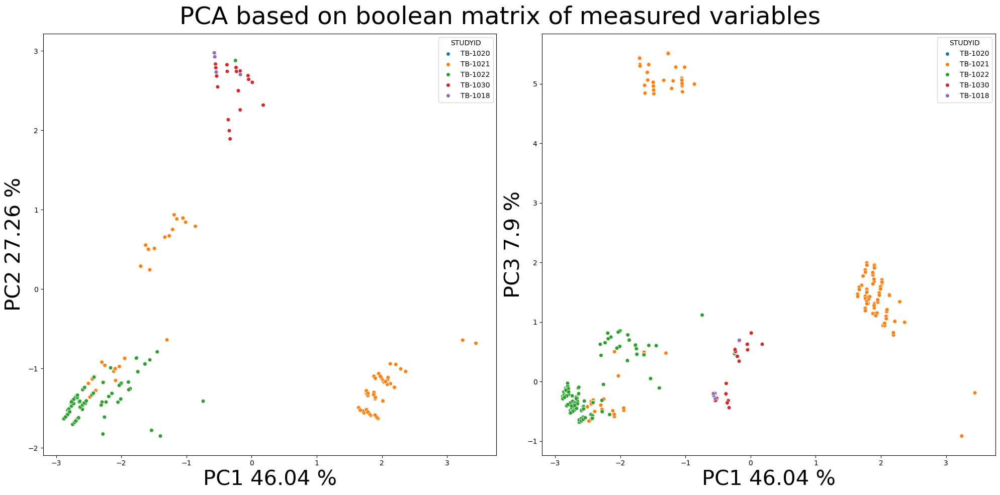

In [14]:
#load all the variables per patient dataframe
variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)


#load patient IDs who are considered in this  analysis
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv.gz',index_col=0)
pat_id_df=pat_id_df[pat_id_df['USUBJID'].isin(variables_per_patient_all.index)]

vars_per_pat_ttp=variables_per_patient_all.dropna(how='all',axis=1).fillna(0)
#mb_cols_to_drop='|'.join(['mb_Culture Growth','mb_Categorical Count','mb_Colony Count','mb_Colony Count, Categorical','mb_Unknown'])
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.contains(mb_cols_to_drop,na=False)]
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,vars_per_pat_ttp.apply(pd.Series.nunique)!=1]
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,vars_per_pat_ttp.sum(axis=0)>10]
vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.startswith(('ae_','mh_','cm'))]


data=vars_per_pat_ttp

### Calculate PCA
pca = PCA(n_components=3)
pca_features = pca.fit_transform(data)
 
pca_df = pd.DataFrame(data=pca_features, columns=['PC1', 'PC2', 'PC3'])
pca_df[['STUDYID','ARM']]=pat_id_df.loc[:,['STUDYID','ARM']].values

fig,axes=plt.subplots(1,2,figsize=(20,10))
hue='STUDYID'
#hue='ARM'

## Plot PCA
sns.scatterplot(data=pca_df,x='PC1',y='PC2',hue=hue,ax=axes[0],s=30)
axes[0].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=30)
axes[0].set_ylabel('PC2 ' + str(round(100*pca.explained_variance_ratio_[1],2))+ ' %',fontsize=30)

sns.scatterplot(data=pca_df,x='PC1',y='PC3',ax=axes[1],hue=hue,s=30)
axes[1].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=30)
axes[1].set_ylabel('PC3 ' + str(round(100*pca.explained_variance_ratio_[2],2))+ ' %',fontsize=30)
#ax[1].legend().set_visible(False)
fig.suptitle('PCA based on boolean matrix of measured variables',fontsize=35)
plt.tight_layout()




## Plot PCA of available variables per patient for patients with therapy outcome information

Extracting relapse information...


Text(0.5, 0.9, 'PCA based on boolean matrix of measured variables')

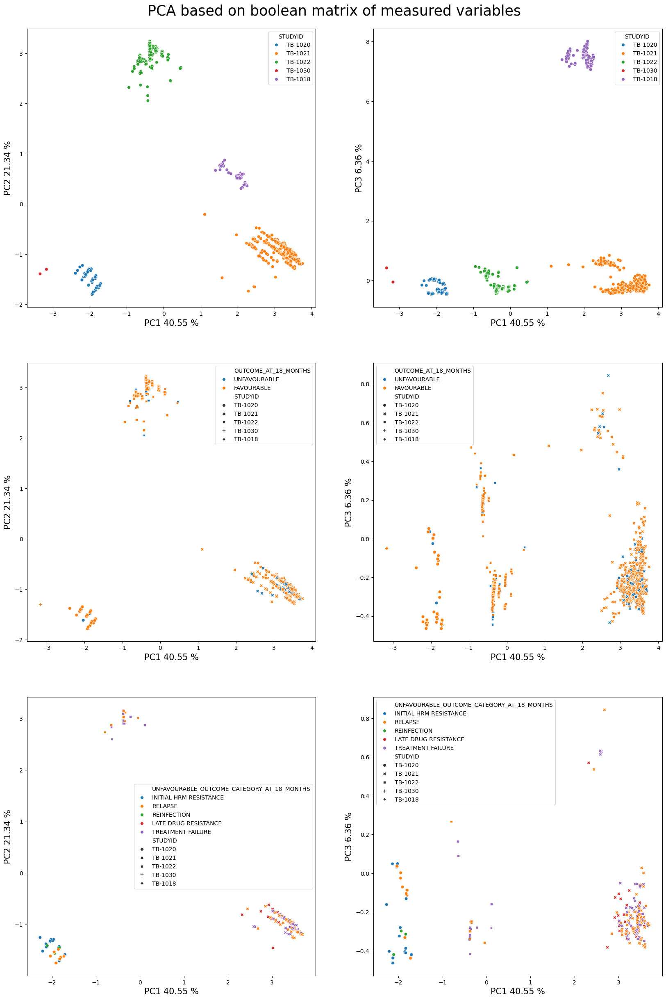

In [15]:
#outcome_df=pd.read_csv('../data/tb_1018_20_21_22_30_outcome.csv.gz',index_col=0)

## ADD RELAPSE for REMOXTB and OFLOTUB patients
pats_with_relapse_df=extract_21_22_relapse_pats(include_rifaquin=True)
outcome_df=pd.read_csv('../data/tb_1018_20_21_22_30_outcome.csv.gz',index_col=0)
outcome_df = outcome_df.set_index('USUBJID')
outcome_df.loc[pats_with_relapse_df.index,'RELAPSE']=pats_with_relapse_df['RELAPSE'].values

#tb_1020_pats = outcome_df[(outcome_df['STUDYID']=='TB-1020')&\
#            (outcome_df['UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS'].str.contains('FAVOURABLE|RELAPSE'))].dropna(how='all',axis=1).index
#outcome_df.loc[tb_1020_pats,'RELAPSE'] = outcome_df.loc[tb_1020_pats,'UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS'].values
outcome_df = outcome_df.reset_index()

#load all the variables per patient dataframe
variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)
outcome_df_ = outcome_df.loc[outcome_df['USUBJID'].isin(variables_per_patient_all.index),:].copy()

vars_per_pat_ttp=variables_per_patient_all.dropna(how='all',axis=1).fillna(0)
mb_cols_to_drop='|'.join(['mb_Culture Growth','mb_Categorical Count','mb_Colony Count','mb_Colony Count, Categorical','mb_Unknown'])
vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.contains(mb_cols_to_drop,na=False)]

#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,vars_per_pat_ttp.apply(pd.Series.nunique)!=1]
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,vars_per_pat_ttp.sum(axis=0)>10]
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.startswith(('ae_','ce_','mh_','cmind','cm'))]

data=vars_per_pat_ttp.loc[outcome_df_['USUBJID'].tolist(),:].dropna(how='all',axis=1)
#data=data.loc[:,data.apply(pd.Series.nunique)!=1]

### Calculate PCA
pca = PCA(n_components=3)
pca_features = pca.fit_transform(data)
#umap_res=umap.UMAP(n_neighbors=2, random_state=42).fit(data)
 
pca_df = pd.DataFrame(data=pca_features, columns=['PC1', 'PC2', 'PC3'])
pca_df[['STUDYID']]=pat_id_df.loc[pat_id_df['USUBJID'].isin(outcome_df['USUBJID'].tolist()),['STUDYID']].values
pca_df[['OUTCOME_AT_18_MONTHS','UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS']]=outcome_df[['RESULT_AT_18_MONTHS','UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS']]


'''
## Get hierachical clustering clusters
dist_metric='euclidean'
linkage_name='ward'
clust_num=5
linkage=hierarchy.linkage(distance.pdist(data,metric=dist_metric), method=linkage_name)
clusters=hierarchy.fcluster(linkage,clust_num,'maxclust')
'''
fig,axes=plt.subplots(3,2,figsize=(20,30))
## Plot PCA
axes=axes.flatten()
dot_size=30
axes_fontsize=15

# Color by studies
sns.scatterplot(data=pca_df,x='PC1',y='PC2',hue='STUDYID',ax=axes[0],s=dot_size)
axes[0].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=axes_fontsize)
axes[0].set_ylabel('PC2 ' + str(round(100*pca.explained_variance_ratio_[1],2))+ ' %',fontsize=axes_fontsize)

sns.scatterplot(data=pca_df,x='PC1',y='PC3',ax=axes[1],hue='STUDYID',s=dot_size)
axes[1].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=axes_fontsize)
axes[1].set_ylabel('PC3 ' + str(round(100*pca.explained_variance_ratio_[2],2))+ ' %',fontsize=axes_fontsize)


## Color by outcome at 18 months
pca_df_wo_unass=pca_df.loc[pca_df['OUTCOME_AT_18_MONTHS']!='UNASSESSABLE',:]
sns.scatterplot(data=pca_df_wo_unass,x='PC1',y='PC2',hue='OUTCOME_AT_18_MONTHS',style='STUDYID',ax=axes[2],s=dot_size)
axes[2].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=axes_fontsize)
axes[2].set_ylabel('PC2 ' + str(round(100*pca.explained_variance_ratio_[1],2))+ ' %',fontsize=axes_fontsize)

sns.scatterplot(data=pca_df_wo_unass,x='PC1',y='PC3',hue='OUTCOME_AT_18_MONTHS',style='STUDYID',ax=axes[3],s=dot_size)
axes[3].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=axes_fontsize)
axes[3].set_ylabel('PC3 ' + str(round(100*pca.explained_variance_ratio_[2],2))+ ' %',fontsize=axes_fontsize)


## Color by unfavourable outcome category at 18 months
pca_df_wo_favour=pca_df.loc[pca_df['UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS']!='FAVOURABLE',:]
sns.scatterplot(data=pca_df_wo_favour,x='PC1',y='PC2',hue='UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS',style='STUDYID',ax=axes[4],s=dot_size)
axes[4].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=axes_fontsize)
axes[4].set_ylabel('PC2 ' + str(round(100*pca.explained_variance_ratio_[1],2))+ ' %',fontsize=axes_fontsize)

sns.scatterplot(data=pca_df_wo_favour,x='PC1',y='PC3',hue='UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS',style='STUDYID',ax=axes[5],s=dot_size)
axes[5].set_xlabel('PC1 ' + str(round(100*pca.explained_variance_ratio_[0],2)) +' %',fontsize=axes_fontsize)
axes[5].set_ylabel('PC3 ' + str(round(100*pca.explained_variance_ratio_[2],2))+ ' %',fontsize=axes_fontsize)
fig.suptitle('PCA based on boolean matrix of measured variables',fontsize=25,y=0.9)
#plt.tight_layout()

# CLUSTER PATIENTS BASED ON THEIR MEASURED VARIABLES
- For each outcome category (outcoma at 12 months, at 18 months, ...) consider only patients in the clustering with available outcome for that category

RESULT_AT_18_MONTHS Num of patients: 3455


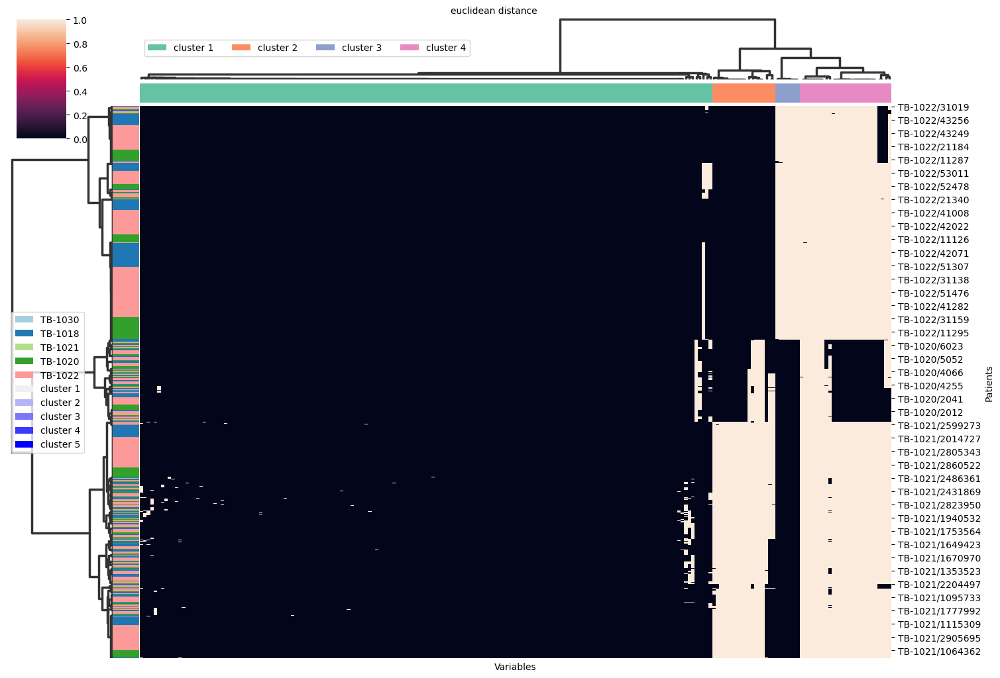

UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS Num of patients: 1967


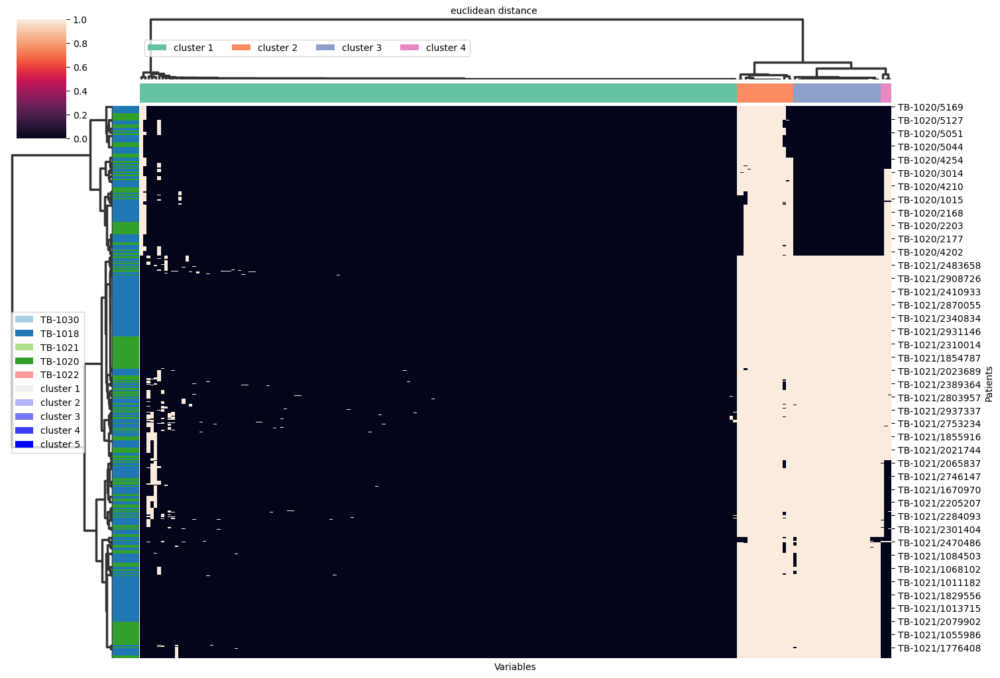

RESULT_AT_END_OF_TREATMENT Num of patients: 4231


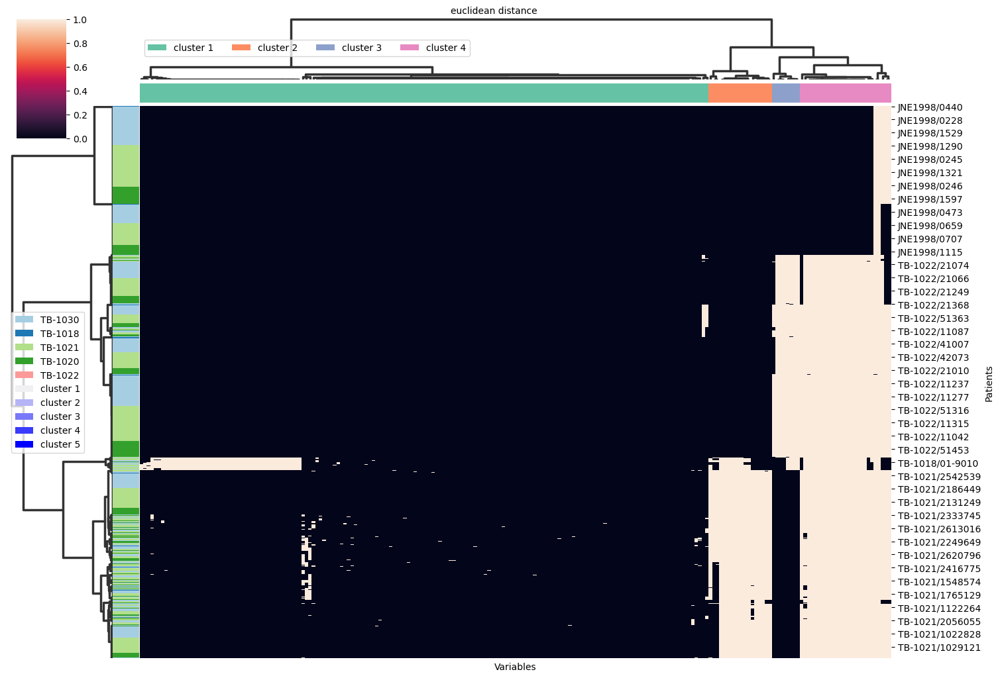

RESULT_AT_12_MONTHS Num of patients: 2331


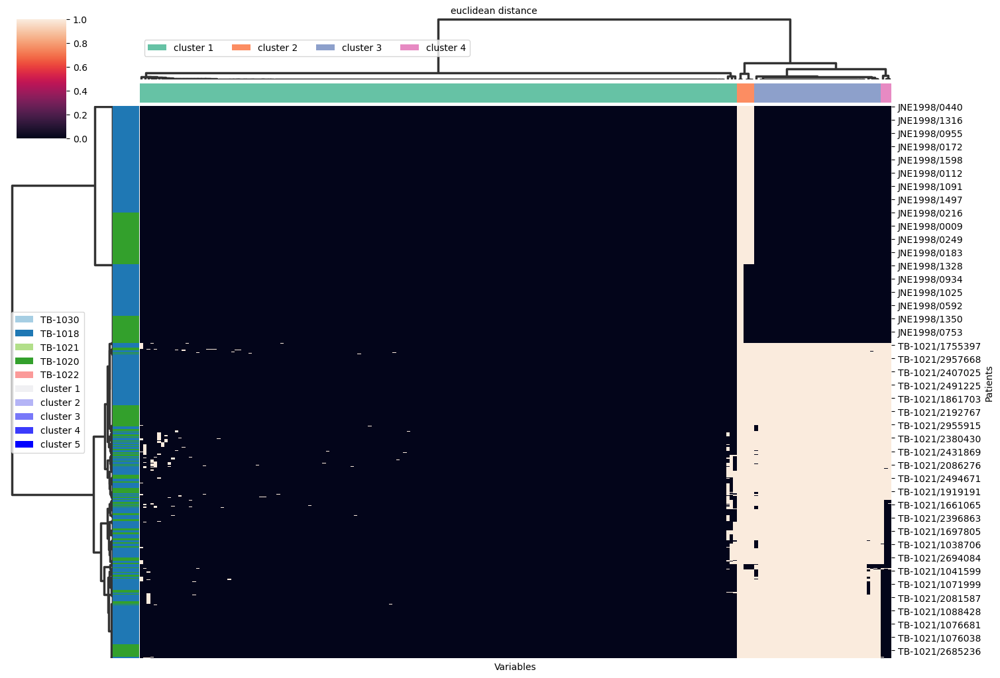

RESULT_AT_24_MONTHS Num of patients: 1387


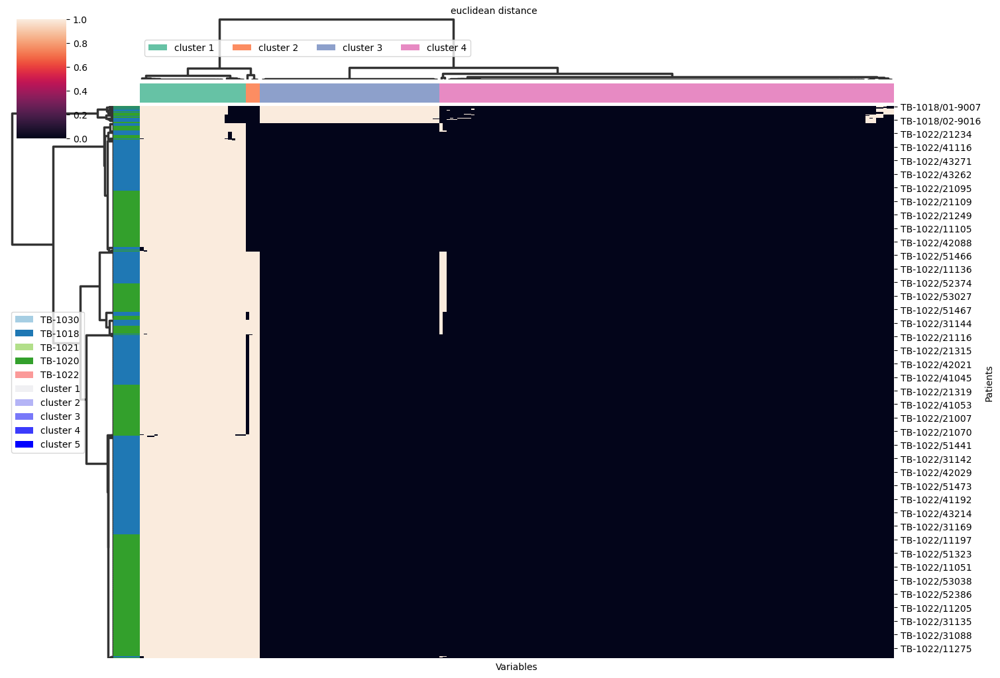

UNFAVOURABLE_OUTCOME_CATEGORY_AT_24_MONTHS Num of patients: 1243


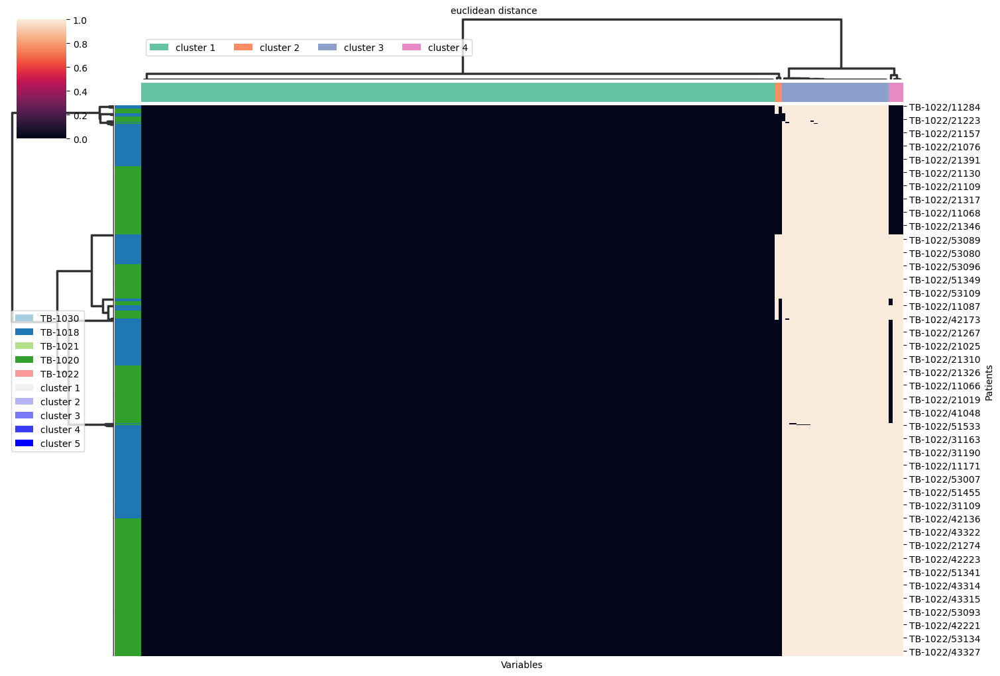

RESULT_AT_30_MONTHS Num of patients: 1016


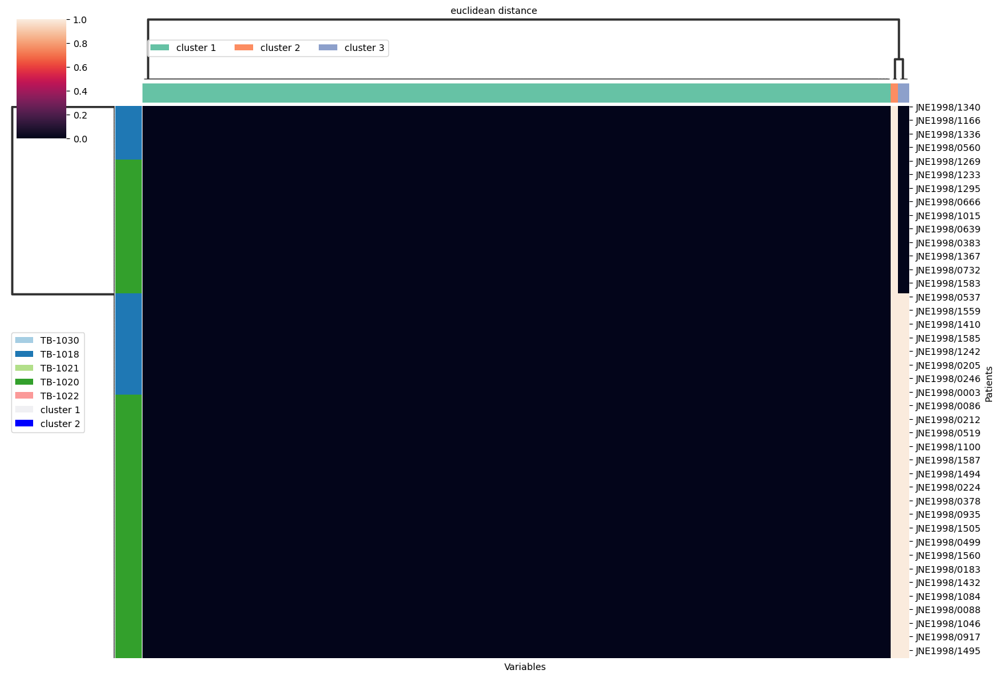

UNFAVOURABLE_OUTCOME_CATEGORY_AT_30_MONTHS Num of patients: 1001


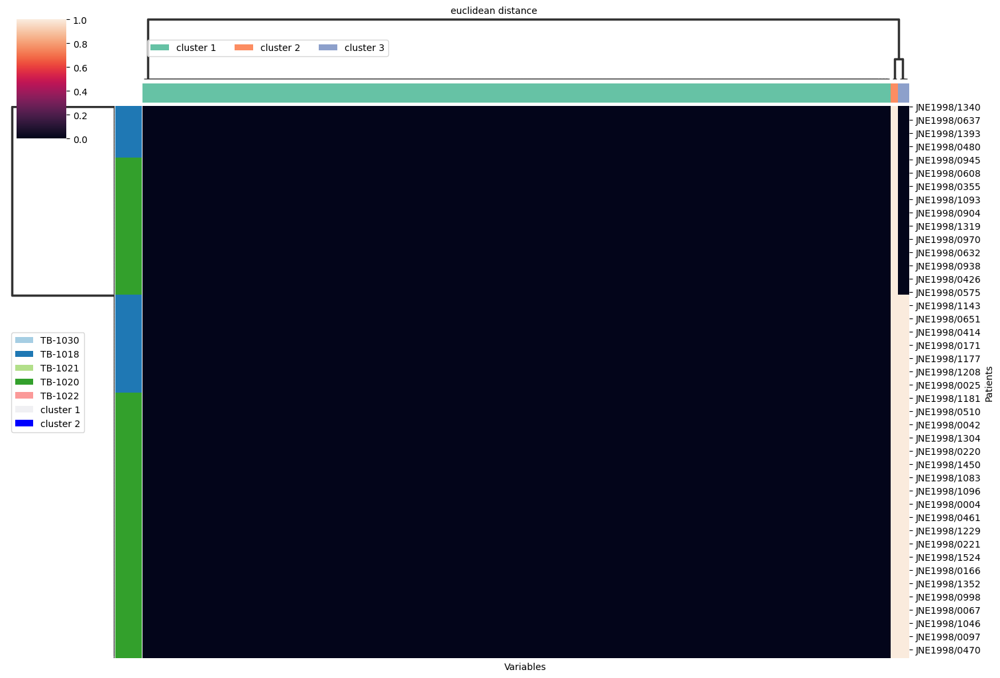

RELAPSE Num of patients: 2908


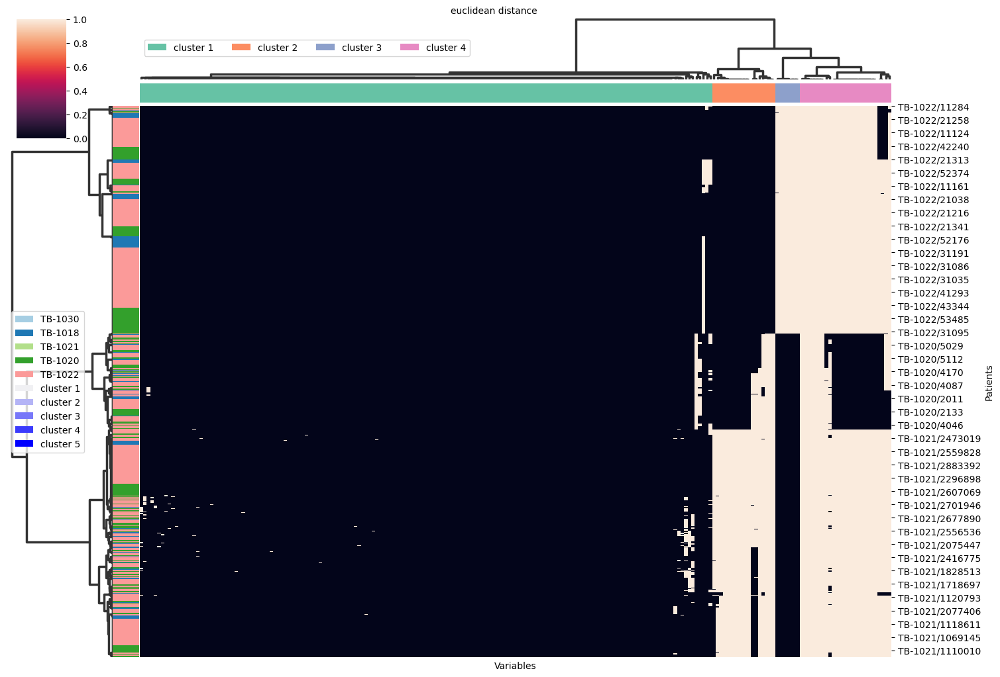

In [16]:
#load all the variables per patient dataframe
variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)

## ADD RELAPSE for REMOXTB and OFLOTUB patients
outcome_df=pd.read_csv('../data/tb_1018_20_21_22_30_outcome.csv.gz',index_col=0)
outcome_df = outcome_df.set_index('USUBJID')
outcome_df.loc[pats_with_relapse_df.index,'RELAPSE']=pats_with_relapse_df['RELAPSE'].values

## ADD TB-1020
#tb_1020_pats = outcome_df[(outcome_df['STUDYID']=='TB-1020')&\
#            (outcome_df['UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS'].str.contains('FAVOURABLE|RELAPSE'))].dropna(how='all',axis=1).index
#d={'FAVOURABLE':0,'RELAPSE':1}
#outcome_df.loc[tb_1020_pats,'RELAPSE'] = outcome_df.loc[tb_1020_pats,'UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS'].map(d)

outcome_df = outcome_df.reset_index()


#load patient IDs who are considered in this  analysis
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv.gz',index_col=0)
pat_id_df=pat_id_df[outcome_df['USUBJID'].isin(variables_per_patient_all.index)]

vars_per_pat_ttp=variables_per_patient_all.loc[pat_id_df['USUBJID'],:].dropna(how='all',axis=1).fillna(0)
vars_per_pat_ttp=vars_per_pat_ttp.loc[:,vars_per_pat_ttp.apply(pd.Series.nunique)!=0]
vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.startswith(('ae_','mh_','cm','STUDYID','ARM'))]



#load all the variables per patient dataframe

#vars_per_pat_ttp=variables_per_patient_all.loc[outcome_df['USUBJID'].tolist(),:].dropna(how='all',axis=1).fillna(0)
data=vars_per_pat_ttp.loc[pat_id_df['USUBJID'].tolist(),:].dropna(how='all',axis=1)


data=vars_per_pat_ttp

### Calculate PCA
pca = PCA(n_components=3)
pca_features = pca.fit_transform(data)
 
pca_df = pd.DataFrame(data=pca_features, columns=['PC1', 'PC2', 'PC3'])
pca_df[['STUDYID']]=pat_id_df.loc[:,['STUDYID']].values

cluster_df_dict={}


for result_cat in outcome_df.columns[~outcome_df.columns.str.contains('STUDYID|USUBJID|LIQUID')]:
    pats_with_outcome=outcome_df.loc[(~outcome_df[result_cat].isna()),'USUBJID'].tolist()
    pats_with_outcome=list(set(pats_with_outcome)&set(pat_id_df['USUBJID'].tolist()))
    
    print(result_cat,'Num of patients:',len(pats_with_outcome))

    '''
    fig,ax=plt.subplots(1,2,figsize=(13,5))
    fig.suptitle(f'Outcome category - {result_cat} - {len(pats_with_outcome)} patients',fontweight='bold',fontsize=12)
    sns.barplot(outcome_df.loc[(~outcome_df[result_cat].isna()),result_cat].value_counts(dropna=False),ax=ax[0])
    sns.barplot(outcome_df.loc[(~outcome_df[result_cat].isna()),'STUDYID'].value_counts(dropna=False),ax=ax[1])
    #ax[0].tick_params(axis='both', which='major', labelsize=10)
    #ax[0].set_xticks(ax[0].get_xticks(), ax[0].get_xticklabels(), rotation=45, ha='right')
    plt.draw()
    ax[0].tick_params(axis='x',labelsize=10,labelrotation=45)
    #ax[0].set_xticklabels(ax[0].get_xticks(), rotation=45, weight='bold', size=12)
    
    ax[0].set_xlabel(None)
    plt.tight_layout()
    '''
    #print(result_cat,outcome_df.loc[(~outcome_df[result_cat].isna()),result_cat].value_counts(dropna=False))
    #print(result_cat,outcome_df.loc[(~outcome_df[result_cat].isna()),'STUDYID'].value_counts(dropna=False))
    #print()
    cluster_df_dict[result_cat]={}

    data_=data.loc[pats_with_outcome,:]
    for dist_metric in ['euclidean','hamming'][:]:
        cluster_df_dict[result_cat][dist_metric]={}
        
        ## Get hierachical clustering clusters
        linkage_name='ward'
    
        # Patient clusters
        pat_clust_num=5
        linkage=hierarchy.linkage(distance.pdist(data_,metric=dist_metric), method=linkage_name)
        pat_clusters=hierarchy.fcluster(linkage,pat_clust_num,'maxclust')
        pats_with_clusters_df=pd.DataFrame({'Pats':data_.index.tolist(),'clusters':pat_clusters})
        cluster_df_dict[result_cat][dist_metric]['pats_with_clusters_df']=pats_with_clusters_df
    
        # Variable clusters
        var_clust_num=4
        linkage=hierarchy.linkage(distance.pdist(data_.T,metric=dist_metric), method=linkage_name)
        var_clusters=hierarchy.fcluster(linkage,var_clust_num,'maxclust')
        vars_with_clusters_df=pd.DataFrame({'Vars':data_.columns.tolist(),'clusters':var_clusters})
        cluster_df_dict[result_cat][dist_metric]['vars_with_clusters_df']=vars_with_clusters_df
        cluster_df_dict[result_cat][dist_metric]['pats_with_outcome']=data_.index.tolist()

        
        ## PLot custermap of variables

        if dist_metric=='euclidean':
    
            ## Row coloring 1
            colname_for_hm_coloring='STUDYID'
            clust_num=len(set(pca_df[colname_for_hm_coloring]))
            colour_pal = sns.color_palette("Paired", clust_num)
            lut1 = dict(zip(set(pca_df[colname_for_hm_coloring]), colour_pal))
            #clusters_df=pd.Series(clusters).to_frame()
            #clusters_df.columns=['Clusters']
            row_colors1=pca_df[colname_for_hm_coloring].map(lut1)
            '''
            '''
            ## Row coloring 2
            colname_for_hm_coloring='STUDYID'
            clust_num=len(set(pat_clusters))
            colour_pal = sns.light_palette("blue", clust_num)
            lut2 = dict(zip(set(pat_clusters), colour_pal))
            row_clusters_df=pd.Series(pat_clusters).to_frame()
            row_clusters_df.columns=['Clusters']
            row_colors2=row_clusters_df['Clusters'].map(lut2)
            '''
            '''
            ## Column coloring
            clust_num=len(set(var_clusters))
            colour_pal = sns.color_palette('Set2', clust_num)
            lut3 = dict(zip(set(var_clusters), colour_pal))
            col_clusters_df=pd.Series(var_clusters).to_frame()
            col_clusters_df.columns=['Clusters']
            col_colors=col_clusters_df['Clusters'].map(lut3)
    
            row_colors=[row_colors1.values,row_colors2.values][:1]
            col_colors_=[col_colors.values]
            figsize=(15,10)
        
            cg=sns.clustermap(data_,
                              method=linkage_name,
                              figsize=figsize,
                              metric=dist_metric,
                              xticklabels=False,
                              row_colors=row_colors,
                              col_colors=col_colors_,
                              tree_kws=dict(linewidths=2.5),
                              dendrogram_ratio=(0.12,0.1))
            
            cg.ax_heatmap.set_xlabel('Variables', fontsize=10)                  
            cg.ax_heatmap.set_ylabel('Patients', fontsize=10)            
        
        
            # Create the legend for the row colors
            for label in set(pca_df['STUDYID']):
                cg.ax_row_dendrogram.bar(0, 0, color=lut1[label],
                                        label=label, linewidth=0)
        
            # Create the legend for the row colors
            for label in set(row_clusters_df['Clusters']):
                cg.ax_row_dendrogram.bar(0, 0, color=lut2[label],
                                        label='cluster '+str(label), linewidth=0)
        
            # Create the legend for the row colors
            for label in set(col_clusters_df['Clusters']):
                cg.ax_col_dendrogram.bar(0, 0, color=lut3[label],
                                        label='cluster '+str(label), linewidth=0)                             
        
        
            ncols=len(set(pca_df['STUDYID']))
            cg.ax_row_dendrogram.legend(loc='center left',ncol=1,fontsize=10)
            cg.ax_col_dendrogram.legend(loc='center left',ncol=(clust_num),fontsize=10)
            cg.fig.suptitle(dist_metric+' distance',fontsize=10,y=1) 
            plt.show()
            

# CLUSTER PATIENTS BASED ON GRAPH METRICS OF PATIENTS/VARIABLE GRAPHS

## LONG RUNTIME !!!: Create graph with patients as nodes and number of overlapping variables as edges

In [15]:
cluster_df_dict.keys()#[result_cat].keys()

dict_keys(['RESULT_AT_18_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS', 'RESULT_AT_END_OF_TREATMENT', 'RESULT_AT_12_MONTHS', 'RESULT_AT_24_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_24_MONTHS', 'RESULT_AT_30_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_30_MONTHS'])

In [11]:
#load all the variables per patient dataframe
variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)
vars_per_pat_ttp=variables_per_patient_all.loc[:,\
            ~variables_per_patient_all.columns.str.startswith(('ae_','mh_','cm','STUDYID','ARM','vs_Height'))].fillna(0)

#load patient IDs who are considered in this  analysis
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv.gz',index_col=0)

#mb_cols_to_drop='|'.join(['mb_Culture Growth','mb_Categorical Count','mb_Colony Count','mb_Colony Count, Categorical','mb_Unknown'])
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.contains(mb_cols_to_drop,na=False)]
vars_per_pat_ttp_for_graph=vars_per_pat_ttp.loc[:,vars_per_pat_ttp.apply(pd.Series.nunique)!=0]


### Get all possible combinations of clusters (i.e. with 3 clusters:[[1],[2],[3,],[1,2],[1,3],[1,2,3]])
def get_combinations(start, end):
    combinations_list = []
    for r in range(1, end - start + 2):
        combinations_list.extend(list(combinations(range(start, end + 1), r)))
    return combinations_list

pat_cluster_combinations = get_combinations(1, pat_clust_num)
result_cat=''
pats_with_clusters_df=cluster_df_dict[]['euclidean']['pats_with_clusters_df']
cluster_df_dict[result_cat]

pat_gr_common_dict={}

for pat_cluster_combination in pat_cluster_combinations[:]:
    pat_clust_comb='-'.join(map(str, pat_cluster_combination))
    pat_gr_common_dict[pat_clust_comb]={}
    

    clust_pats=pats_with_clusters_df.loc[(pats_with_clusters_df['clusters'].isin(pat_cluster_combination)),'Pats'].tolist()
    vars_dict=vars_per_pat_ttp_for_graph.loc[vars_per_pat_ttp_for_graph.index.isin(clust_pats),:].T.to_dict('series')
    print('pat cluster combination:',pat_clust_comb,len(clust_pats),' pats')

    graph_data = {}
    for row_name,row_data in vars_dict.items():
        graph_data[row_name]=row_data[row_data==1].index.tolist()

    pat_gr = nx.Graph()

    study_dict=dict(zip(pat_id_df['USUBJID'],pat_id_df['STUDYID']))
    #phase_dict=dict(zip(pat_id_df['USUBJID'],pat_id_df['PHASE']))

    # Add nodes and attributes to the graph using add_nodes_from
    for node, attrs in graph_data.items():
        pat_gr.add_node(node, vars=attrs,study=study_dict[node])


    # Loop through all pairs of nodes and add edges based on the number of overlapping attributes
    for i, (node1, attrs1) in enumerate(pat_gr.nodes(data='vars')):
        for node2, attrs2 in list(pat_gr.nodes(data='vars'))[i+1:]:
            overlap = len(set(attrs1).intersection(set(attrs2)))
            if (overlap) > 0:
                pat_gr.add_edge(node1, node2, weight=overlap)



    ## Calculate pagerank of graph
    pat_gr_page_rank = nx.pagerank(pat_gr)


    pat_gr_centr_list=[pat_gr_page_rank]
    pat_gr_centr_list_names=['Page rank']
    plot_graph=False

    if plot_graph==True:
        ### PLot graph

        pos = nx.spring_layout(pat_gr)
        np.random.seed(1)
        # set figure size
        fig, axes = plt.subplots(1,len(pat_gr_centr_list),figsize=(len(pat_gr_centr_list)*10, 7.5))
        node_size = 2
        edge_width = 0.0001
        for centr_data,centr_data_name,n in zip(pat_gr_centr_list,pat_gr_centr_list_names,range(len(pat_gr_centr_list))):
            if max(centr_data.values())!=0:
                node_size=[(15*v)/max(centr_data.values()) for v in centr_data.values()]
            nx.draw(pat_gr,pos,node_size=node_size,width=edge_width,ax=axes)
            axes.set_title('Graph of patients with PageRank metric')




    ### PLot number of availble variables and number of patients + save these combinations into a dictionary
    num_of_pats={}
    num_of_vars={}
    colour_pal = sns.color_palette("Paired", len(pat_gr_centr_list))
    legend_=[]
    sns.set_style("whitegrid")
    centr_series_list=[]

    for centr,centr_name,k in zip(pat_gr_centr_list,pat_gr_centr_list_names,range(0,len(pat_gr_centr_list))):
        centr_series=pd.Series(centr).sort_values(ascending=False)
        centr_series_list.append(centr_series)
        num_of_pats[centr_name]=[]
        num_of_vars[centr_name]=[]
        pat_gr_common_dict[pat_clust_comb][centr_name]={}

        centr_series_sorted=centr_series.sort_values(ascending=False)
        if centr_name=='clustering_score':
            centr_series_sorted=centr_series.sort_values(ascending=True)


        for centr_val in (centr_series_sorted.unique()): 
            
            common_pats=centr_series_sorted[centr_series_sorted>=centr_val].index.tolist()
            if centr_name=='clustering_score':
                common_pats=centr_series_sorted[centr_series_sorted<=centr_val].index.tolist()

            comm_vars_mask=vars_per_pat_ttp.loc[common_pats,:].apply(lambda x:(x==1)).all(axis=0)
            common_vars=vars_per_pat_ttp.columns[comm_vars_mask].tolist()

            pat_gr_common_dict[pat_clust_comb][centr_name][len(common_vars)]={}
            pat_gr_common_dict[pat_clust_comb][centr_name][len(common_vars)][len(common_pats)]={}
            pat_gr_common_dict[pat_clust_comb][centr_name][len(common_vars)][len(common_pats)]['common_pats']=common_pats
            pat_gr_common_dict[pat_clust_comb][centr_name][len(common_vars)][len(common_pats)]['common_vars']=common_vars

            num_of_pats[centr_name].append(len(common_pats))
            num_of_vars[centr_name].append(len(common_vars))



    fig,axes=plt.subplots(1,1,figsize=(16,7))
    colour_pal = sns.color_palette("Paired", len(pat_gr_centr_list))
    num_of_vars=[]
    num_of_pats=[]
    for var_num in pat_gr_common_dict[pat_clust_comb]['Page rank']:
        pat_num=[*pat_gr_common_dict[pat_clust_comb]['Page rank'][var_num]][0]
        num_of_vars.append(var_num)
        num_of_pats.append(pat_num)

    sns.barplot(x=num_of_vars,y=num_of_pats,ax=axes,color=colour_pal[0],alpha=0.8)
                    #marker="o")
    #legend_.append(mpatches.Patch(color=colour_pal[k], label=centr_name))


    #axes.axhline(y=500)
    #axes.set_xlim(0,80)
    #axes.legend(handles=legend_)
    axes.set_title('Common variables with patient graph metric - Cluster '+str(pat_clust_comb),fontsize=32)
    axes.set_ylabel('No. of Patients',fontsize=25)
    axes.set_xlabel('No. of availables common variables',fontsize=25)
    axes.set_xticklabels(axes.get_xticklabels(), fontsize=14)
    for bars in axes.containers:
        axes.bar_label(bars,fontsize=15)
    plt.tight_layout()

with open('../data/pat_gr_common_dict.pickle', 'wb') as f:
    pickle.dump(pat_gr_common_dict, f)



KeyError: 'euclidean'

In [19]:
num_of_vars=47
d=pat_gr_common_dict.copy()
num_of_pats=[*d['3']['Page rank'][num_of_vars]][0]
print(sorted(d['3']['Page rank'][num_of_vars][num_of_pats]['common_vars']))
#without_ce=sorted(d['3']['Page rank'][num_of_vars][num_of_pats]['common_vars'])
print('without ce, num of pats: ',num_of_pats)

['AGE', 'ARM', 'RACE', 'SEX', 'STUDYID', 'ce_CHEST PAIN', 'ce_COUGH', 'ce_DYSPNEA', 'ce_FEVER', 'ce_HAEMOPTYSIS', 'ce_SWEAT', 'ce_WEIGHT LOSS', 'lb_Blood Activated Partial Thromboplastin Time', 'lb_Blood Alanine Aminotransferase', 'lb_Blood Albumin', 'lb_Blood Aspartate Aminotransferase', 'lb_Blood Creatinine', 'lb_Blood Creatinine Clearance', 'lb_Blood Hemoglobin', 'lb_Blood Platelets', 'lb_Blood Potassium', 'lb_Blood Prothrombin Intl. Normalized Ratio', 'lb_Blood Prothrombin Time', 'lb_Blood Sodium', 'lb_Blood Total Bilirubin', 'lb_Blood Urea', 'mb_Categorical Count', 'mb_Colony Count', 'mb_Colony Count, Categorical', 'mb_Culture Growth', 'mb_Identification', 'mb_Time to Detection', 'mr_Isoniazid', 'mr_Rifampicin', 'ms_Ethambutol', 'ms_Isoniazid', 'ms_Moxifloxacin', 'ms_Pyrazinamide', 'ms_Rifampicin', 'ms_Streptomycin', 're_Cavitation', 'su_SMOKING EVER', 'vs_Diastolic Blood Pressure', 'vs_Pulse Rate', 'vs_Systolic Blood Pressure', 'vs_Temperature', 'vs_Weight']
without ce, num of pa

## Create graph with variables as nodes and number of overlapping patients as edges

RESULT_AT_18_MONTHS
UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS


/tmp/ipykernel_96031/3686427363.py:104: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,axes=plt.subplots(1,1,figsize=(12,4))


RESULT_AT_12_MONTHS
RESULT_AT_END_OF_TREATMENT


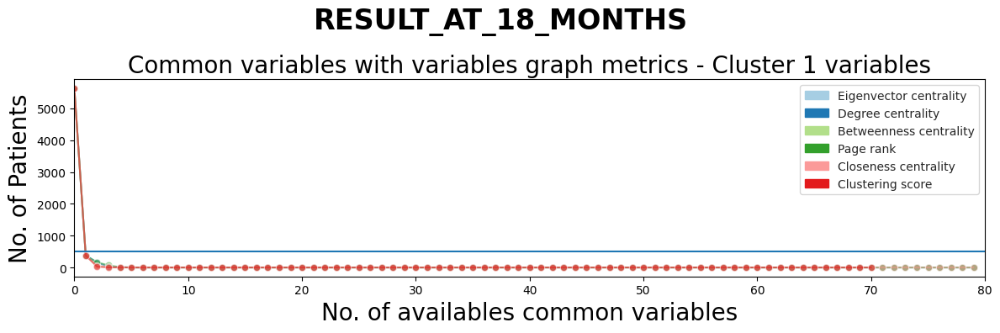

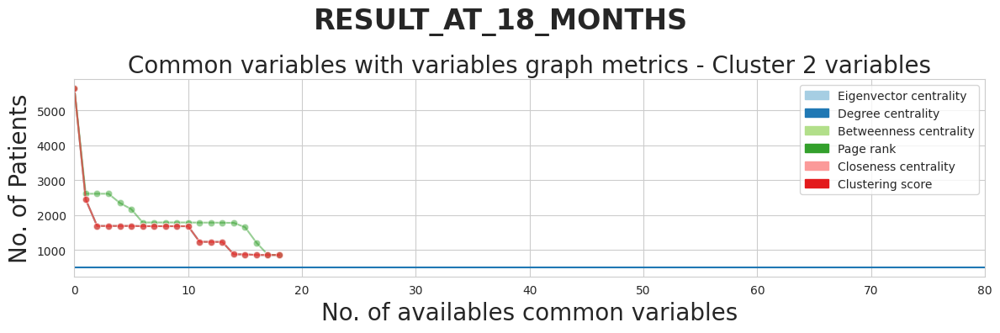

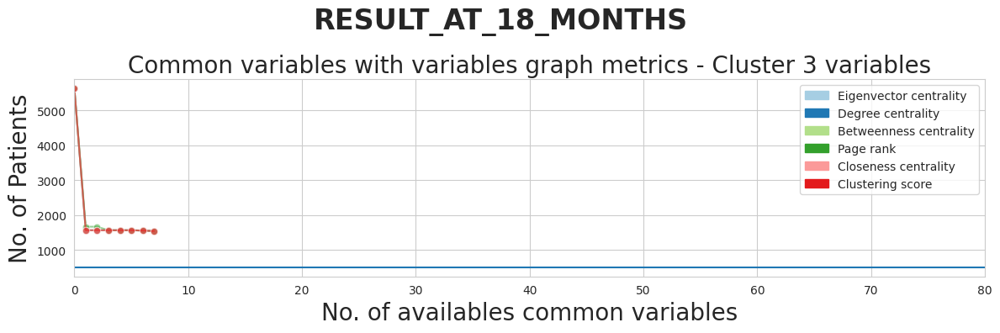

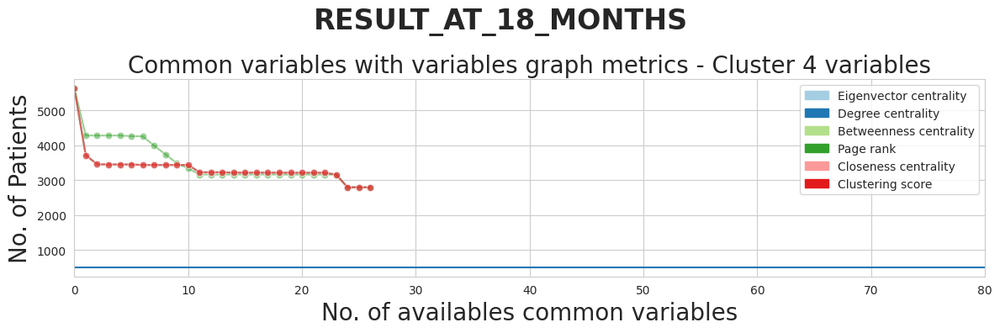

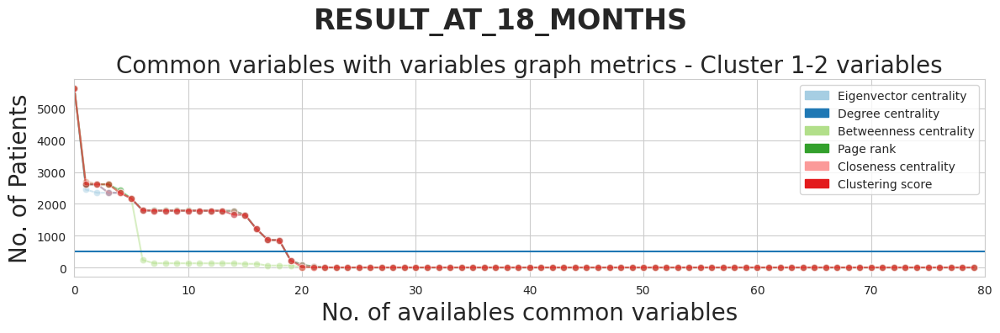

...

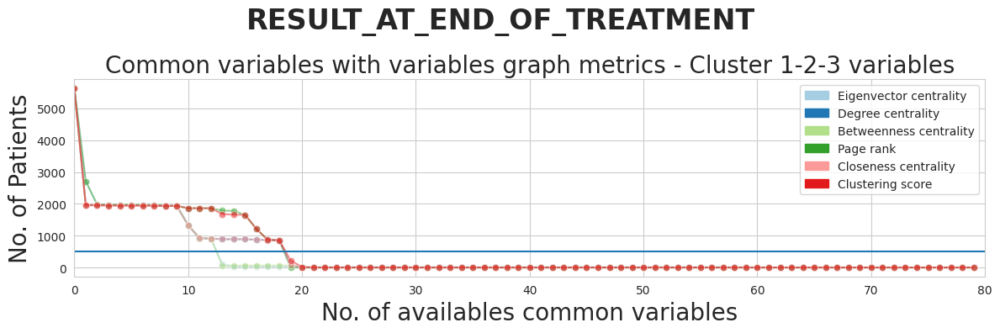

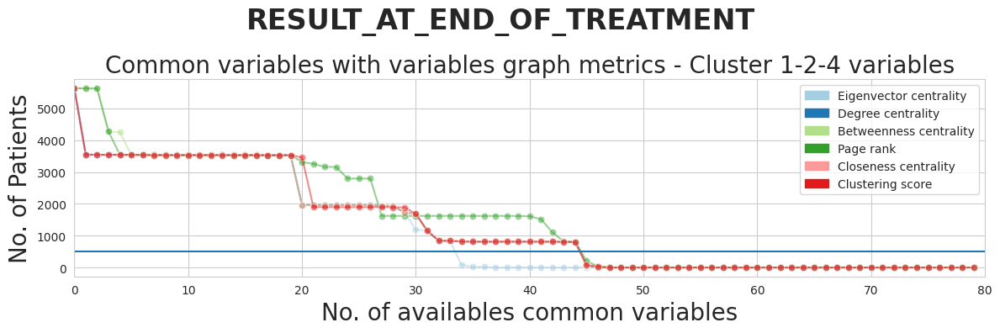

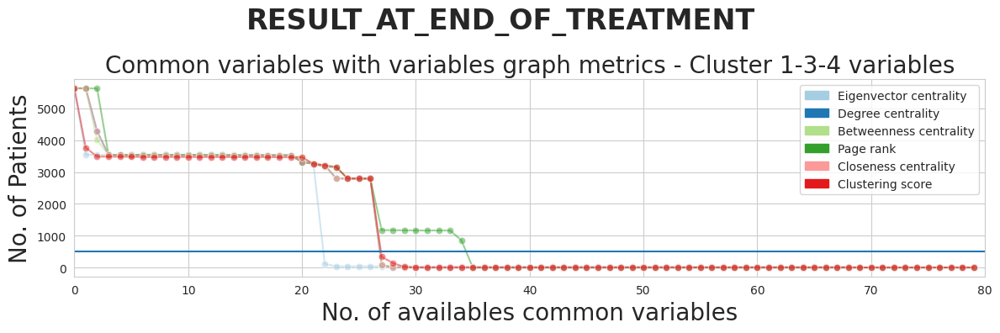

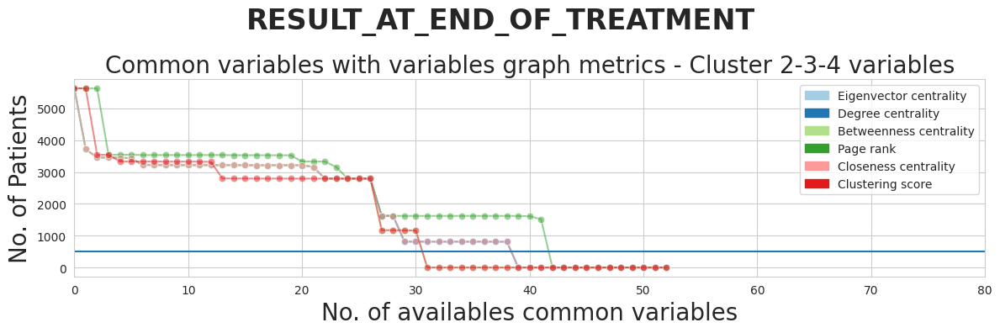

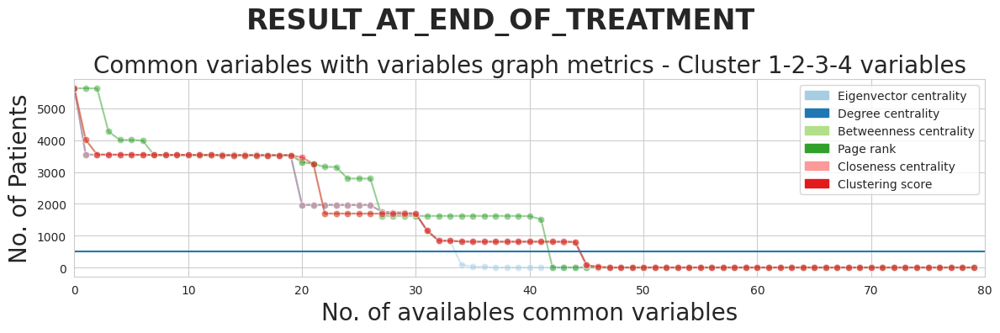

In [8]:
### Get all possible combinations of clusters (i.e. with 3 clusters:[[1],[2],[3,],[1,2],[1,3],[1,2,3]])
def get_combinations(start, end):
    combinations_list = []
    for r in range(1, end - start + 2):
        combinations_list.extend(list(combinations(range(start, end + 1), r)))
    return combinations_list


variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)
vars_per_pat_ttp=variables_per_patient_all.loc[:,\
                                    ~variables_per_patient_all.columns.str.startswith(('ae_','mh_','cm','STUYDID','ARM'))].fillna(0)

#mb_cols_to_drop='|'.join(['mb_Culture Growth','mb_Categorical Count','mb_Colony Count','mb_Colony Count, Categorical','mb_Unknown'])
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.contains(mb_cols_to_drop,na=False)]
vars_per_pat_ttp_for_graph=vars_per_pat_ttp.loc[:,vars_per_pat_ttp.apply(pd.Series.nunique)!=0]



var_gr_common_dict={}

### LOOP THROUGH THE OUTCOME RESULT CATEGORIES, AND ONLY CONSIDER PATIENTS THAT HAVE AVAILABLE DATA FOR THE OUTCOME CATEGORY
#outcome_df.columns[~outcome_df.columns.str.contains('STUDYID|USUBJID|LIQUID')]
result_cats=['RESULT_AT_18_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS',
               'RESULT_AT_12_MONTHS','RESULT_AT_END_OF_TREATMENT',
               'RESULT_AT_24_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_24_MONTHS',
               'RESULT_AT_30_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_30_MONTHS']

for result_cat in result_cats[0:4]:
    print(result_cat)

    
    ### Get all possible combinations of clusters (i.e. with 3 clusters:[[1],[2],[3,],[1,2],[1,3],[1,2,3]])
    var_cluster_combinations = get_combinations(1, var_clust_num)
    vars_with_clusters_df=cluster_df_dict[result_cat]['euclidean']['vars_with_clusters_df']
    pats_with_outcome_result_cat=cluster_df_dict[result_cat][dist_metric]['pats_with_outcome']

    var_gr_common_dict[result_cat]={}

    for var_cluster_combination in var_cluster_combinations[:]:
        var_clust_comb='-'.join(map(str, var_cluster_combination))
        var_gr_common_dict[result_cat][var_clust_comb]={}
        
    
        clust_vars=vars_with_clusters_df.loc[(vars_with_clusters_df['clusters'].isin(var_cluster_combination)),'Vars'].tolist()
        vars_dict=vars_per_pat_ttp_for_graph.loc[pats_with_outcome_result_cat,
                                                vars_per_pat_ttp_for_graph.columns.isin(clust_vars)].dropna(how='all',axis=1).to_dict('series')
        #print(vars_dict.keys())
    
        graph_data = {}
        for row_name,row_data in vars_dict.items():
            graph_data[row_name]=row_data[row_data==1].index.tolist()
    
        vars_gr = nx.Graph()
    
        # Add nodes and attributes to the graph using add_nodes_from
        for node, attrs in graph_data.items():
            vars_gr.add_node(node, pats=attrs)
    
    
        # Loop through all pairs of nodes and add edges based on the number of overlapping attributes
        for i, (node1, attrs1) in enumerate(vars_gr.nodes(data='pats')):
            for node2, attrs2 in list(vars_gr.nodes(data='pats'))[i+1:]:
                overlap = len(set(attrs1).intersection(set(attrs2)))
                if (overlap) > 0:
                    vars_gr.add_edge(node1, node2, weight=overlap)
    
    
                                    
        # Calculate degree centrality for the nodes
        vars_gr_degree_centr = nx.degree_centrality(vars_gr)
    
        # Calculate betweenness centrality for the nodes
        vars_gr_betweenness_centr = nx.betweenness_centrality(vars_gr)
    
        # Calculate eigenvector centrality for the nodes
        vars_gr_eigenvector_centr = nx.eigenvector_centrality(vars_gr)
        vars_gr_page_rank = nx.pagerank(vars_gr)
        vars_gr_closeness_centr = nx.closeness_centrality(vars_gr)
        vars_gr_clustering = nx.clustering(vars_gr)
        #vars_gr_katz_cent = nx.katz_centrality(vars_gr,alpha=0.01,max_iter=2000)
    
        centr_list=[vars_gr_eigenvector_centr,vars_gr_degree_centr,vars_gr_betweenness_centr,\
                    vars_gr_page_rank,vars_gr_closeness_centr,vars_gr_clustering]#,vars_gr_katz_cent]
        centr_list_names=['Eigenvector centrality','Degree centrality','Betweenness centrality',\
                          'Page rank','Closeness centrality','Clustering score']#,katz_centr']
    
        plot_graph=False
        if plot_graph==True:
            pos = nx.spring_layout(vars_gr)
            np.random.seed(4812)
            # set figure size
            fig, axes = plt.subplots(2,len(centr_list)//2,figsize=(len(centr_list)*2, 8))
            node_size = 2
            edge_width = 0.001
            for centr_data,centr_data_name,n,ax in zip(centr_list,centr_list_names,range(len(centr_list)),axes.flatten()):
                nx.draw(vars_gr,pos,node_size=[(5*v)/max(centr_data.values()) for v in centr_data.values()],width=edge_width,ax=ax)
                ax.set_title(centr_data_name)
    
    
    
        ### PLot number of availble variables and number of patients + save these combinations into a dictionary
        num_of_pats={}
        num_of_vars={}
        fig,axes=plt.subplots(1,1,figsize=(12,4))
        fig.suptitle(result_cat,fontweight='bold',fontsize=24)
        colour_pal = sns.color_palette("Paired", len(centr_list))
        legend_=[]
        sns.set_style("whitegrid")
        centr_series_list=[]
    
        for centr,centr_name,k in zip(centr_list,centr_list_names,range(0,len(centr_list))):
            centr_series=pd.Series(centr).sort_values(ascending=False)
            centr_series_list.append(centr_series)
            num_of_pats[centr_name]=[]
            num_of_vars[centr_name]=[]
            var_gr_common_dict[result_cat][var_clust_comb][centr_name]={}
    
            for n in range(0,80): 
                common_vars=centr_series.sort_values(ascending=False).index[0:n].tolist()
                if centr_name=='Clustering score':
                    common_vars=centr_series[centr_series>0].sort_values(ascending=True).index[0:n].tolist()
    
                comm_pats_mask=vars_per_pat_ttp[common_vars].apply(lambda x:(x==1)).all(axis=1)
                common_pats=vars_per_pat_ttp.loc[comm_pats_mask].index.tolist()
                var_gr_common_dict[result_cat][var_clust_comb][centr_name][len(common_vars)]={}
                var_gr_common_dict[result_cat][var_clust_comb][centr_name][len(common_vars)][len(common_pats)]={}
                var_gr_common_dict[result_cat][var_clust_comb][centr_name][len(common_vars)][len(common_pats)]['common_pats']=common_pats
                var_gr_common_dict[result_cat][var_clust_comb][centr_name][len(common_vars)][len(common_pats)]['common_vars']=common_vars
    
                num_of_pats[centr_name].append(len(common_pats))
                num_of_vars[centr_name].append(len(common_vars))
    
    
            sns.lineplot(x=num_of_vars[centr_name],y=num_of_pats[centr_name],ax=axes,color=colour_pal[k],alpha=0.5,
                        marker="o")
            legend_.append(mpatches.Patch(color=colour_pal[k], label=centr_name))
    
    
        axes.axhline(y=500)
        #axes.set_title('title',fontsize=18) 
        axes.set_title('Common variables with variables graph metrics - Cluster '+ var_clust_comb+' variables' ,fontsize=20)   
        axes.legend(handles=legend_)
        axes.set_ylabel('No. of Patients',fontsize=20)
        axes.set_xlim(0,80)
        axes.set_xlabel('No. of availables common variables',fontsize=20)
        plt.tight_layout()
    
        vars_gr_centr_df=pd.concat(centr_series_list,axis=1)
        vars_gr_centr_df.columns=centr_list_names
    
        var_gr_common_dict[result_cat][var_clust_comb]['df']=vars_gr_centr_df

with open('../data/var_gr_common_dict.pickle', 'wb') as f:
    pickle.dump(var_gr_common_dict, f)




## DEPRECATED: Try randomly picking n number of variables and check how many patients have those measured

In [45]:
variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)

import random

fname='var_gr_common_dict.pickle'
fn=os.path.join('../data/',fname)
with open(fn, 'rb') as f:
    gr_common_dict=pickle.load(f)

sample_size=35
centr_meas='Page rank'
vars_gr_centr_df=gr_common_dict['1-2-3-4']['df']
#vars_gr_centr_df=vars_gr_centr_df.apply(lambda x: x / np.max(x), axis=0)
num_of_sampling=10000

# Normalize 'Page rank' values to create a probability distribution
centr_probabilities = vars_gr_centr_df[centr_meas] / vars_gr_centr_df[centr_meas].sum()

# Normalize Frequency of variables to create a probability distribution
variables_per_patient=variables_per_patient_all.loc[:,vars_gr_centr_df.index.tolist()]
freq_probabilities=(variables_per_patient.sum(axis=0)/len(variables_per_patient))/(variables_per_patient.sum(axis=0)/len(variables_per_patient)).sum()
#weights=(variables_per_patient.sum(axis=0)/len(variables_per_patient))

for n in range(num_of_sampling):

    sampled_indices = np.random.choice(vars_gr_centr_df.index, size=sample_size, replace=False, p=centr_probabilities)
    #sampled_indices=random.choices(vars_gr_centr_df.index,weights=weights,k=sample_size)

    # Retrieve the sampled rows from the DataFrame
    sampled_rows = vars_gr_centr_df.loc[sampled_indices,centr_meas]
    sampled_vars=sampled_rows.index.tolist()
    sampled_vars.sort()
    if len(variables_per_patient_all.loc[:,sampled_vars].dropna(how='any',axis=0))>3000:
        print(sampled_vars)
        print('len of sampled vars: ',len(sampled_vars),'len of patients: ',len(variables_per_patient_all.loc[:,sampled_vars].dropna(how='any',axis=0)))
        print()

KeyError: '1-2-3-4'

# SELECT PATIENTS BASED ON AVAILABLE NUMBER OF VARIABLES

## Selection method:Patient clustering
* #### 1.Start with patient with most available variables in the cluster combination
* #### 2. Loop over patients in cluster combination and add next patient with highest number of variables
* #### 3. Check and record the available __common__ variables for the patients already added 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


RELAPSE


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

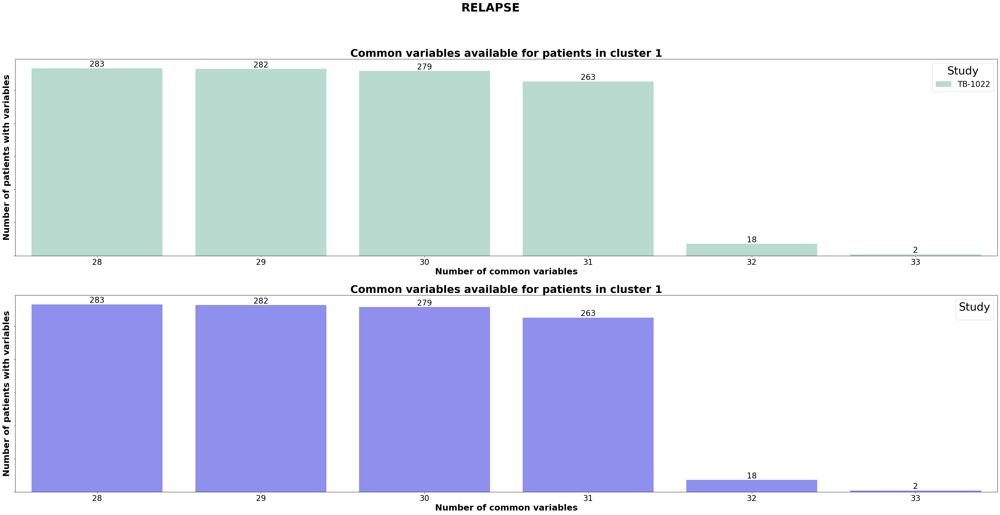

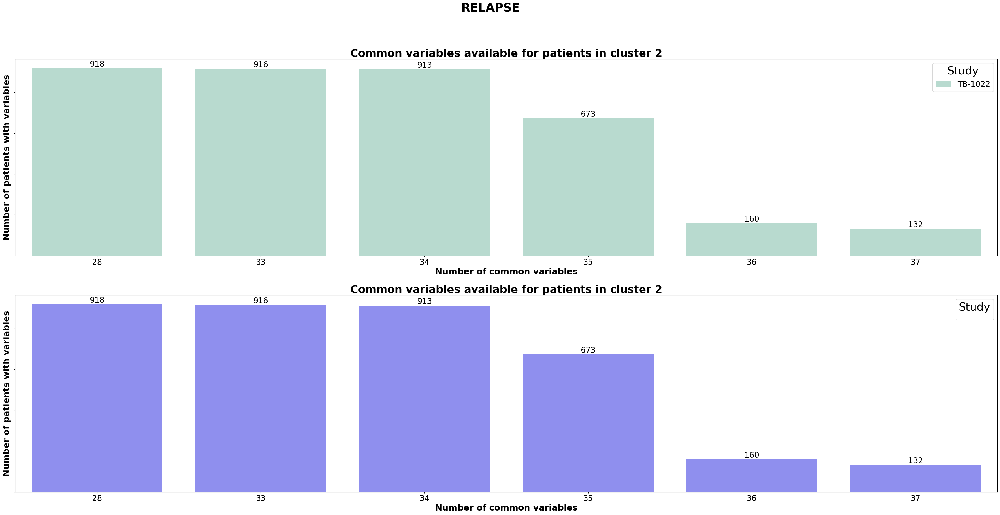

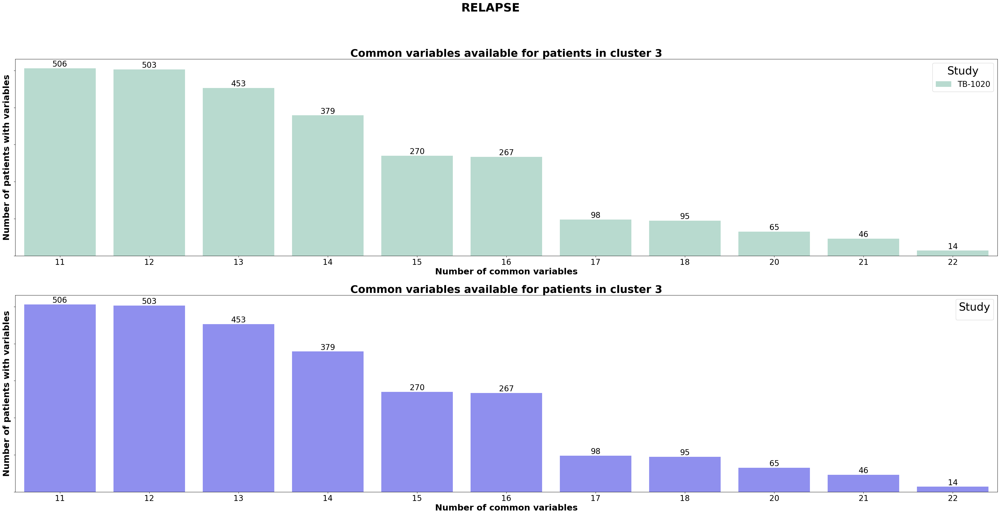

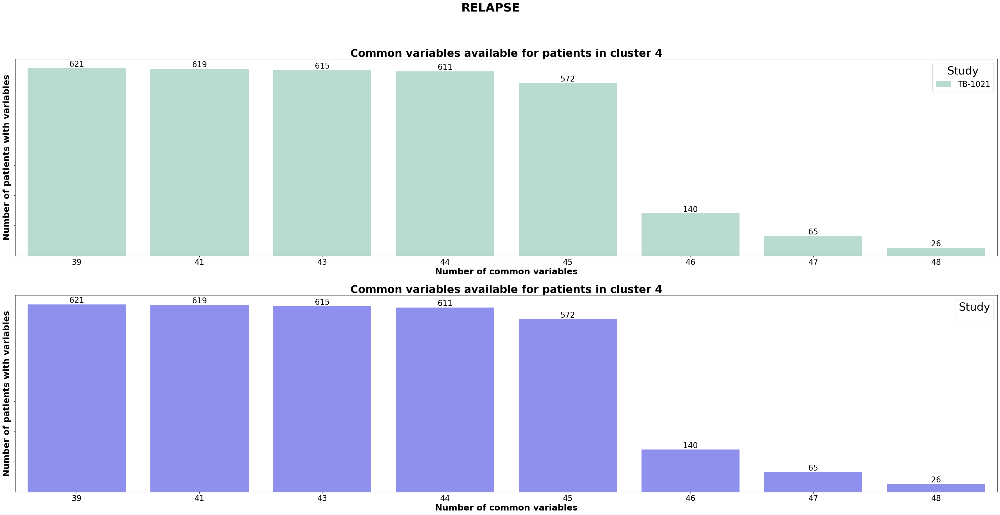

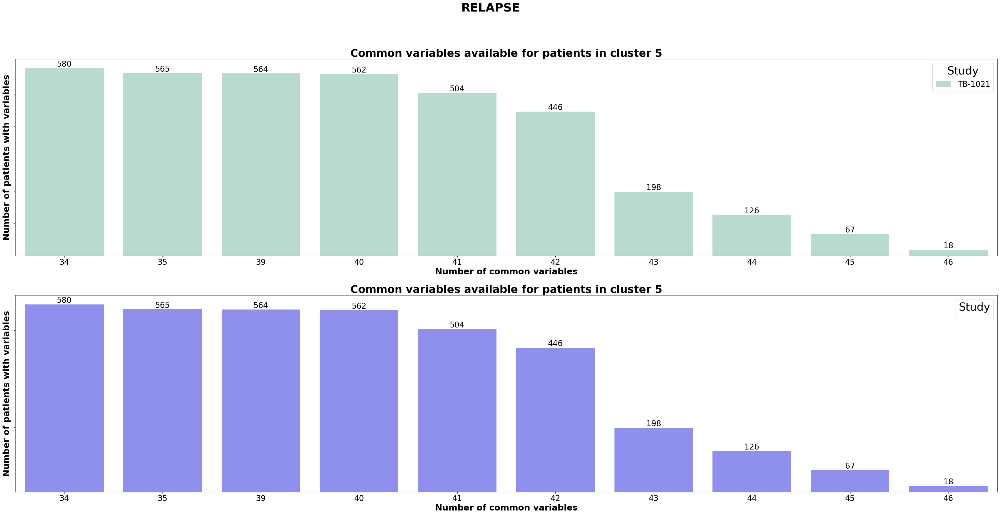

...

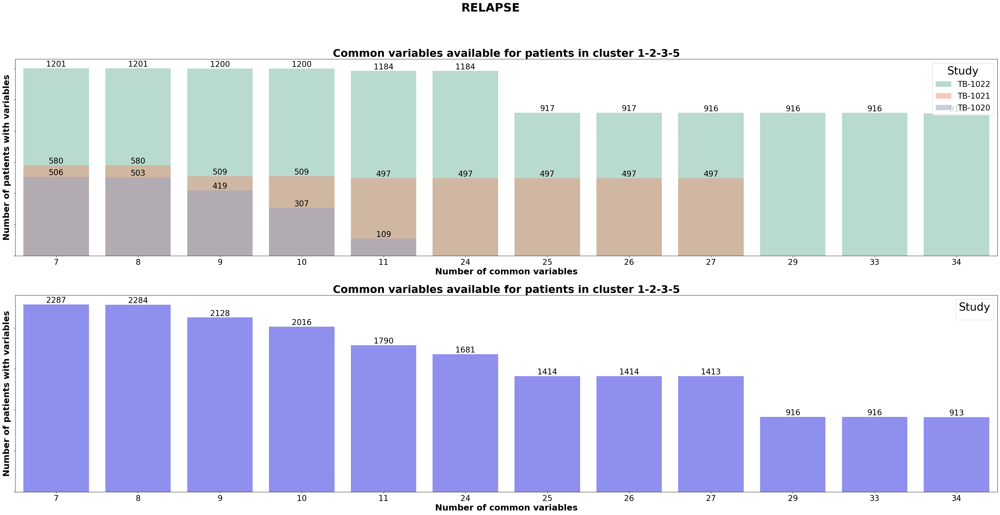

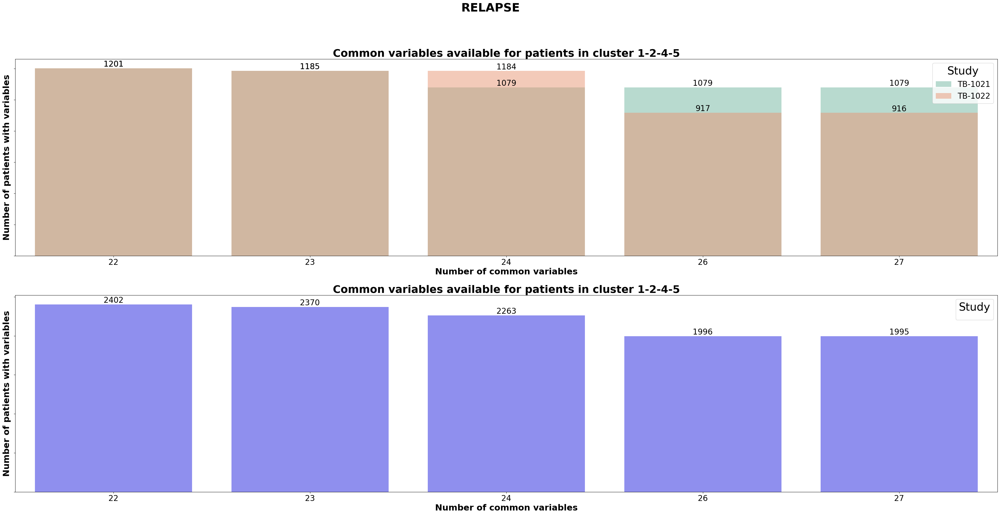

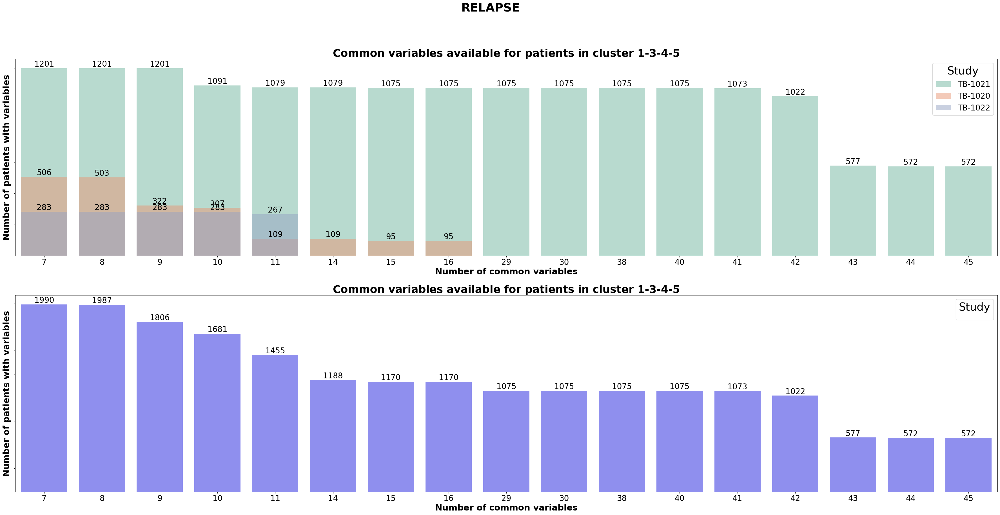

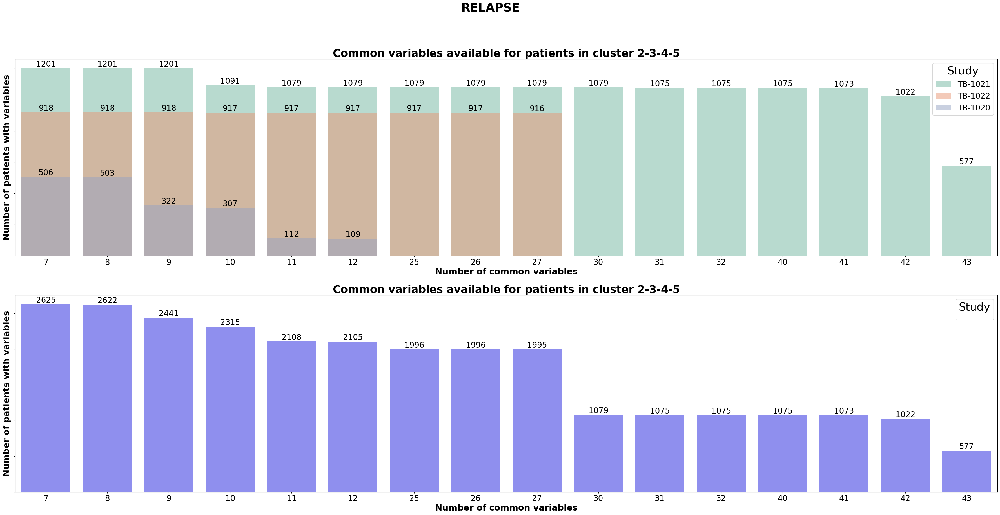

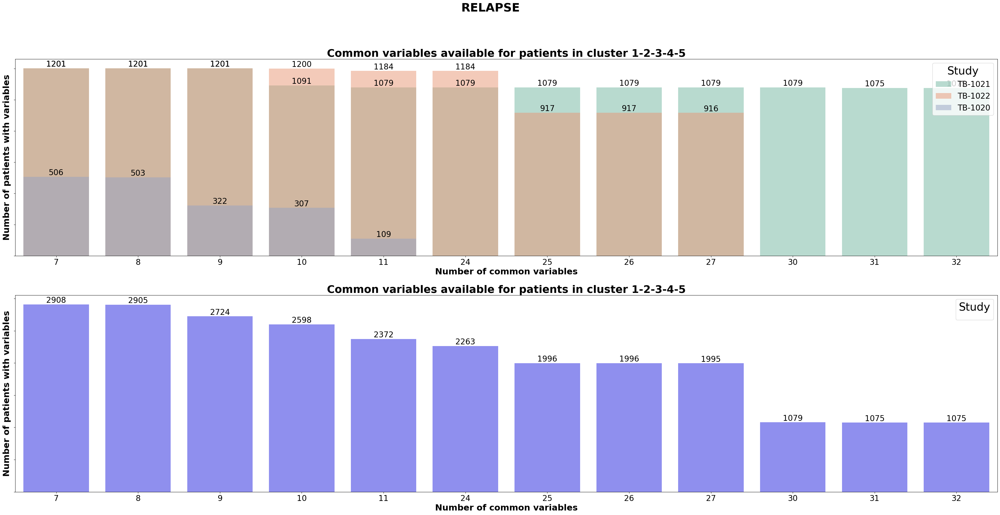

In [17]:
import warnings
warnings.filterwarnings("ignore")


### Get all possible combinations of clusters (i.e. with 3 clusters:[[1],[2],[3,],[1,2],[1,3],[1,2,3]])
def get_combinations(start, end):
    combinations_list = []
    for r in range(1, end - start + 2):
        combinations_list.extend(list(combinations(range(start, end + 1), r)))
    return combinations_list


variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)
vars_per_pat_ttp=variables_per_patient_all.loc[:,:].dropna(how='all',axis=1).fillna(0)
vars_per_pat_ttp=vars_per_pat_ttp.loc[:,\
                                     ~vars_per_pat_ttp.columns.str.startswith(('ae_','mh_','cm','STUYDID','ARM'))]

#mb_cols_to_drop='|'.join(['mb_Culture Growth','mb_Categorical Count','mb_Colony Count','mb_Colony Count, Categorical','mb_Unknown'])
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.contains(mb_cols_to_drop,na=False)]


common_var_nums={}
pat_clust_common_vars={}

### LOOP THROUGH THE OUTCOME RESULT CATEGORIES, AND ONLY CONSIDER PATIENTS THAT HAVE AVAILABLE DATA FOR THE OUTCOME CATEGORY
result_cats=['RESULT_AT_18_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS',
               'RESULT_AT_12_MONTHS','RESULT_AT_END_OF_TREATMENT','RELAPSE',
               'RESULT_AT_24_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_24_MONTHS',
               'RESULT_AT_30_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_30_MONTHS']

#dist_metric='hamming'
dist_metric='euclidean'


for result_cat in result_cats[4:5]:
    print(result_cat)

    pat_clust_common_vars[result_cat]={}
    common_var_nums[result_cat]={}

    pat_cluster_combinations = get_combinations(1, pat_clust_num)
    pats_with_clusters_df=cluster_df_dict[result_cat][dist_metric]['pats_with_clusters_df']

    for pat_cluster_combination in pat_cluster_combinations[:]:
        pat_clust_comb='-'.join(map(str, pat_cluster_combination))
        
        clust_pats=pats_with_clusters_df.loc[(pats_with_clusters_df['clusters'].isin(pat_cluster_combination)),'Pats'].tolist()
        
        vars_per_pat_ttp_for_clust=vars_per_pat_ttp.loc[clust_pats,]
    
        pat_clust_comb='-'.join(map(str, pat_cluster_combination))
        #print('number of pats in '+ pat_clust_comb+' :',len(clust_pats))
        common_var_nums[result_cat][pat_clust_comb]={'num_of_patients':[],'num_of_common_variables':[]}
        pat_clust_common_vars[result_cat][pat_clust_comb]={}
    
        vars_available_in_patients=vars_per_pat_ttp_for_clust.sum(axis=0).sort_values(ascending=False)
        vars_available_in_patients=vars_available_in_patients[vars_available_in_patients>=1]
    
        for num_of_var in vars_available_in_patients.unique()[:]:
            vars_for_analyis=vars_available_in_patients[vars_available_in_patients>=num_of_var].index
            vars_df=vars_per_pat_ttp_for_clust.loc[(vars_per_pat_ttp_for_clust[vars_for_analyis]!=0).all(axis=1),vars_for_analyis]
    
            if len(vars_df.index)>0 and len(vars_df.columns)>0:
                common_var_nums[result_cat][pat_clust_comb]['num_of_patients'].append(len(vars_df.index))
                common_var_nums[result_cat][pat_clust_comb]['num_of_common_variables'].append(len(vars_df.columns))
    
                pat_clust_common_vars[result_cat][pat_clust_comb][len(vars_df.columns)]={}
                pat_clust_common_vars[result_cat][pat_clust_comb][len(vars_df.columns)]['patients']=vars_df.index.tolist()
                pat_clust_common_vars[result_cat][pat_clust_comb][len(vars_df.columns)]['common_variables']=vars_df.columns.tolist()
                
        fig,axes=plt.subplots(2,1,figsize=(45,20))
        fig.suptitle(result_cat,y=0.98,fontweight='bold',fontsize=30)
        
        plot_df=pd.DataFrame()
        for num_of_common_vars in pat_clust_common_vars[result_cat][pat_clust_comb].keys():
            #pat_per_phase=(pat_id_df.loc[pat_id_df['USUBJID'].isin(common_vars[pat_clust_comb][num_of_common_vars]['patients']),'PHASE'].value_counts())
            pat_per_study=(pat_id_df.loc[pat_id_df['USUBJID'].isin(pat_clust_common_vars[result_cat][pat_clust_comb][num_of_common_vars]['patients']),'STUDYID'].value_counts())
            
            #temp_df_phase=pd.DataFrame()
            temp_df_study=pd.DataFrame()
    
            #temp_df_phase['Patients_per_phase']=pat_per_phase.values 
            #temp_df_phase['Phase']=pat_per_phase.index.astype(str).tolist()
            #temp_df_phase['Number_of_common_variables']=[num_of_common_vars,]*len(temp_df_phase)
    
            temp_df_study['Patients_per_study']=pat_per_study.values 
            temp_df_study['Study']=pat_per_study.index.astype(str).tolist()
            temp_df_study['Number_of_common_variables']=[num_of_common_vars,]*len(temp_df_study)
            
            #if '-' in pat_clust_comb:
            #    plot_df=pd.concat([plot_df,temp_df_phase],axis=0)
            #if '-' not in pat_clust_comb:
            plot_df=pd.concat([plot_df,temp_df_study],axis=0)
    
        ## If multiple phases then group patients by phases
        #if '-' in pat_clust_comb:
        #    sns.barplot(data=plot_df,y='Patients_per_phase',x='Number_of_common_variables',ax=axes[0],dodge=False,palette=sns.color_palette("Set2"),
        #                hue='Phase')
        #    legend_title='Phase'
        #
        #    plot_df2=plot_df[['Patients_per_phase','Number_of_common_variables']].groupby(by=['Number_of_common_variables']).agg('sum').reset_index()
        #    sns.barplot(data=plot_df2,y='Patients_per_phase',x='Number_of_common_variables',ax=axes[1],dodge=False,color='blue',alpha=0.5)
    
    
        ## If one phase, group by studies
        #if '-' not in pat_clust_comb:
        if len(plot_df)>0:
            sns.barplot(data=plot_df,y='Patients_per_study',x='Number_of_common_variables',ax=axes[0],dodge=False,palette=sns.color_palette("Set2"),
                        hue='Study',alpha=0.5)
            legend_title='Study'
        
            plot_df2=plot_df[['Patients_per_study','Number_of_common_variables']].groupby(by=['Number_of_common_variables']).agg('sum').reset_index()
            sns.barplot(data=plot_df2,y='Patients_per_study',x='Number_of_common_variables',ax=axes[1],dodge=False,color='blue',alpha=0.5)
        
            
            for j in range(len(axes)):
                axes[j].set_xlabel('Number of common variables',fontsize=22,fontweight="bold")
                axes[j].set_ylabel('Number of patients with variables',fontsize=22,fontweight="bold")
                axes[j].set_title('Common variables available for patients in cluster '+ str(pat_clust_comb),fontsize=27,fontweight="bold")
                #axes[j].set_xticklabels(axes[j].get_xticklabels(), fontsize=35)
                axes[j].xaxis.set_tick_params(labelsize=20)
                axes[j].set_yticklabels('')
                axes[j].legend(title=legend_title,loc='upper right',fontsize=20,title_fontsize=28)
                for bars in axes[j].containers:
                    axes[j].bar_label(bars,fontsize=20)


with open('../data/pat_clust_common_vars.pickle', 'wb') as f:
    pickle.dump(pat_clust_common_vars,f)

## Selection method: Variable clustering
* #### 1.Start with patient with most available variables in the cluster combination
* #### 2. Loop over patients in cluster combination and add next patient with highest number of variables
* #### 3. Check and record the available __common__ variables for the patients already added 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


RELAPSE


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

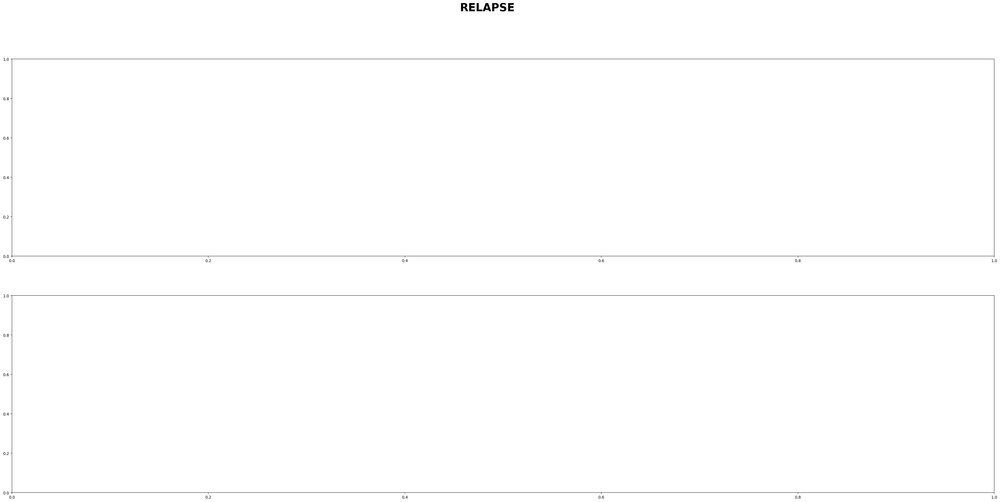

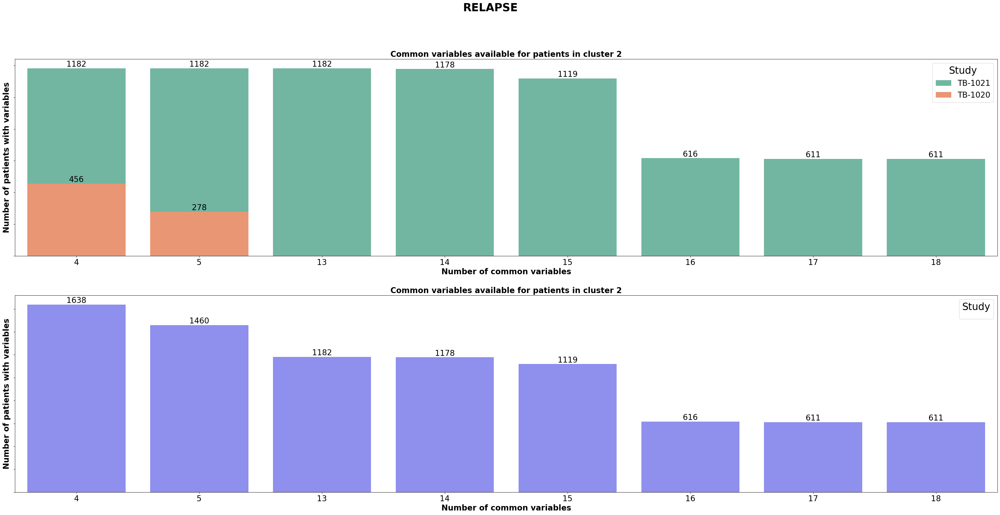

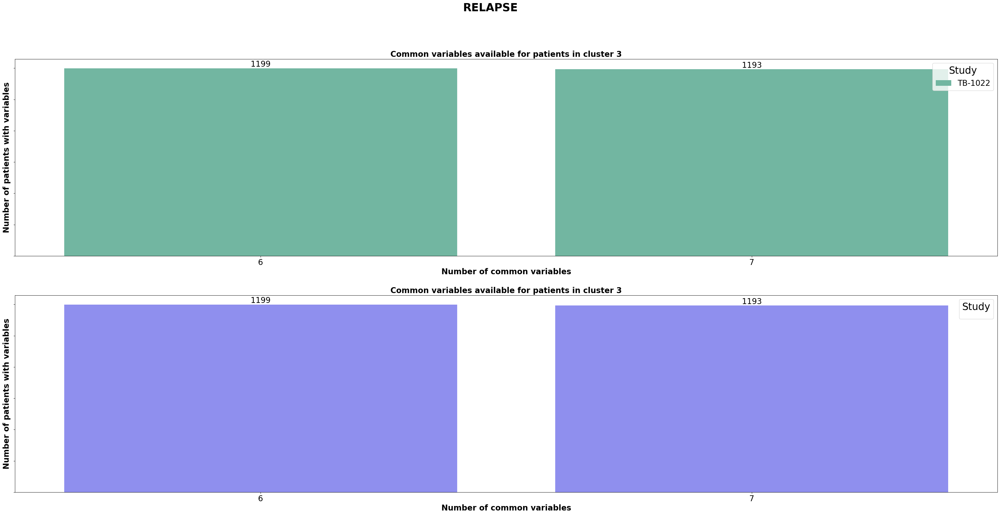

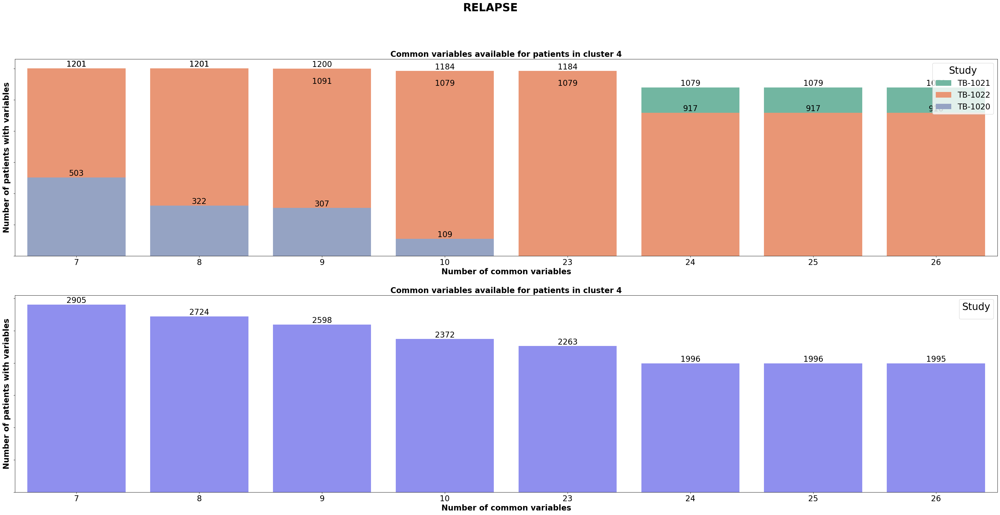

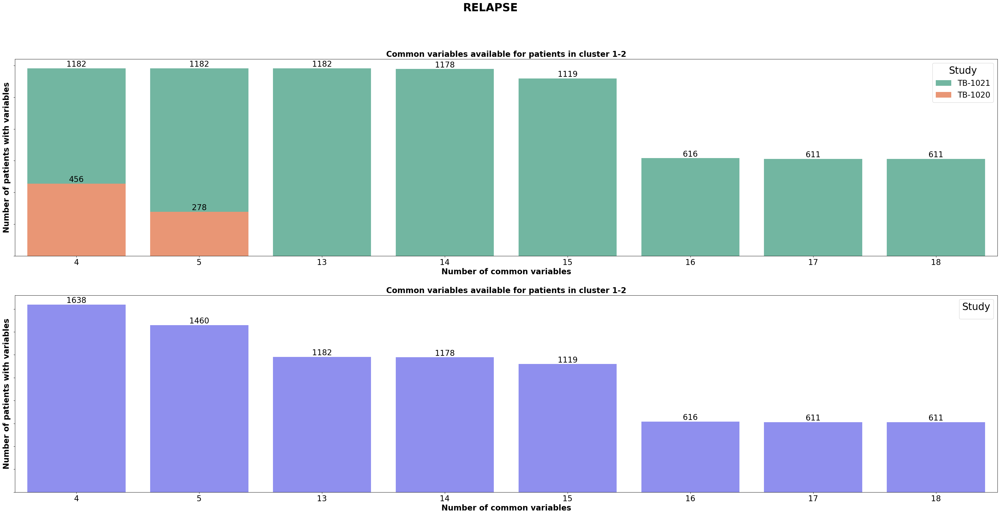

...

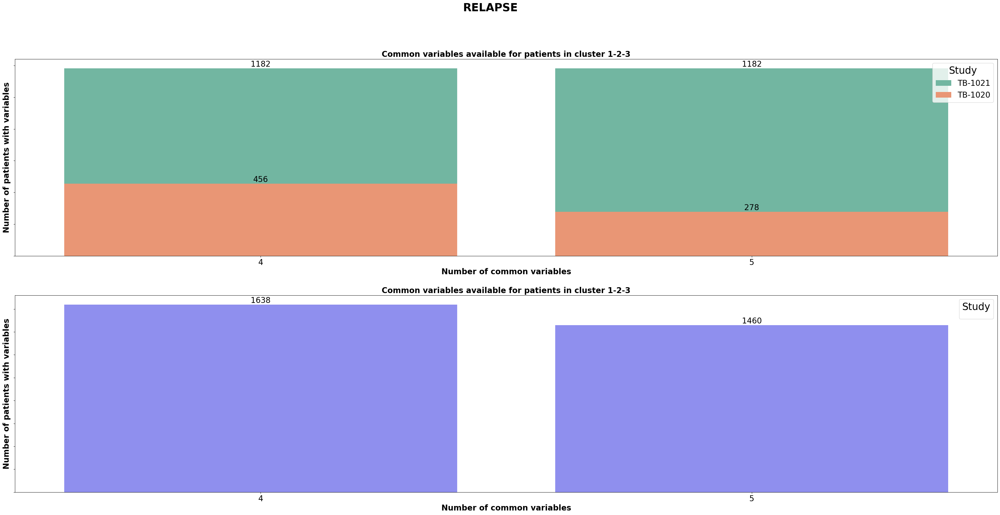

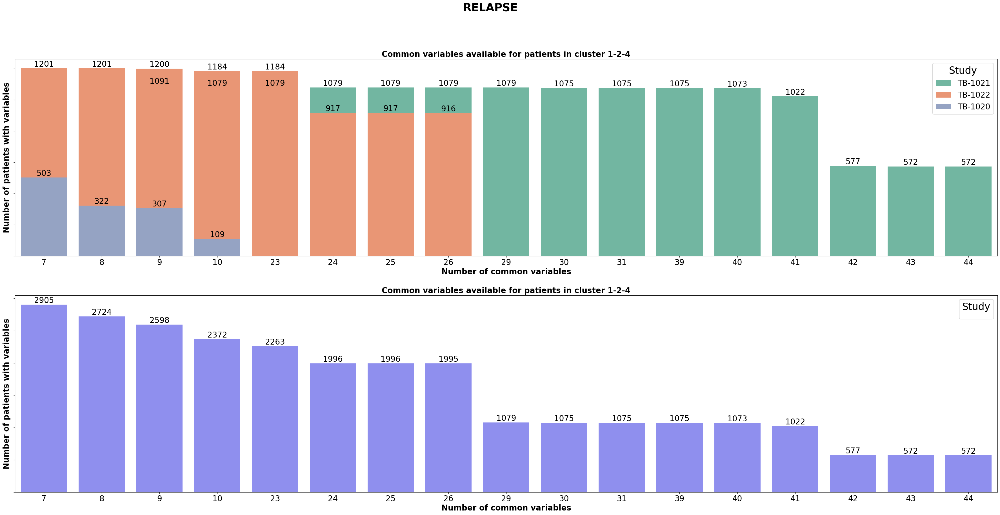

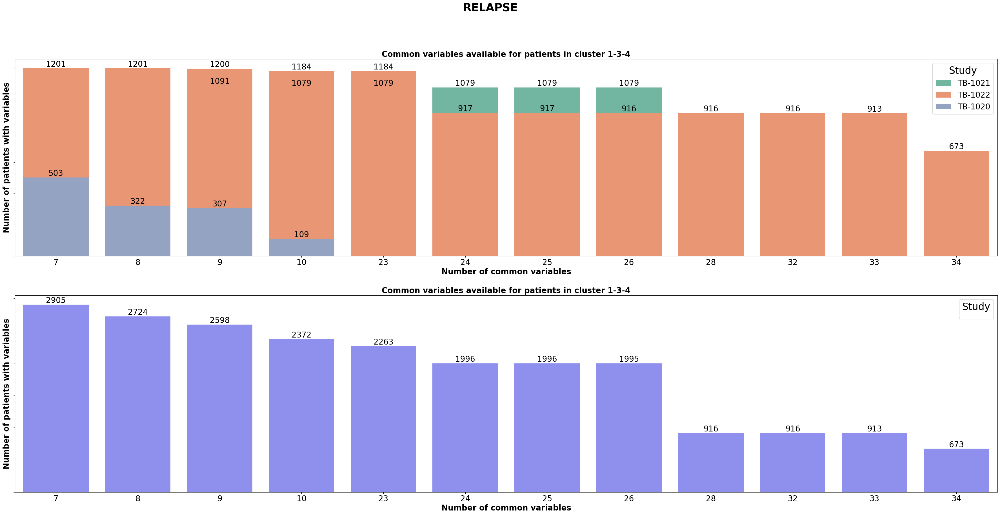

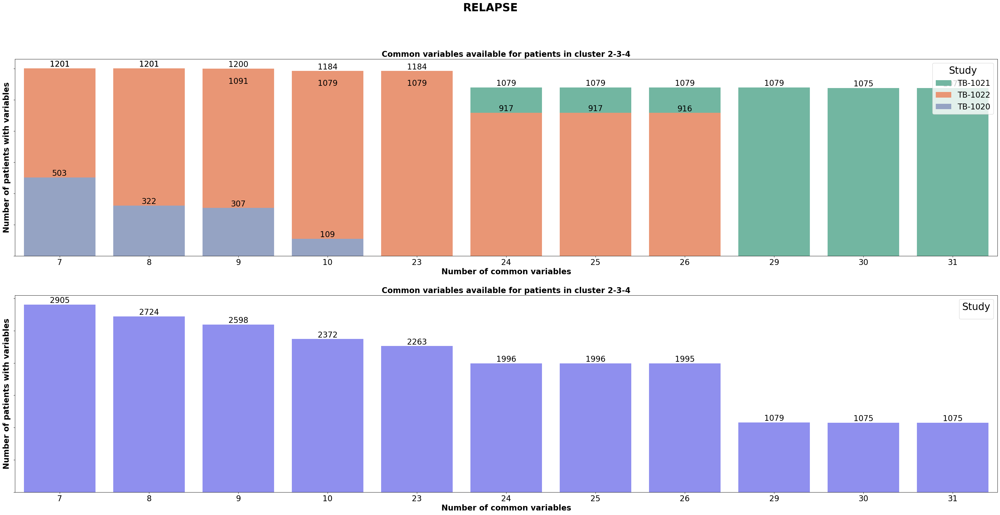

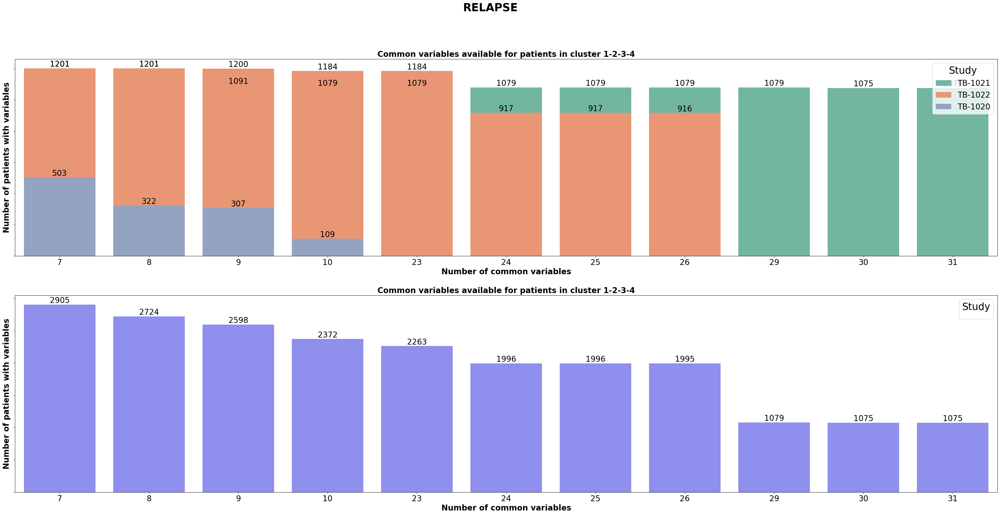

In [18]:
variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)
vars_per_pat_ttp=variables_per_patient_all.loc[:,:].dropna(how='all',axis=1).fillna(0)
vars_per_pat_ttp=vars_per_pat_ttp.loc[:,\
                                      ~vars_per_pat_ttp.columns.str.startswith(('ae_','mh_','cm','STUDYID','ARM'))]

#mb_cols_to_drop='|'.join(['mb_Culture Growth','mb_Categorical Count','mb_Colony Count','mb_Colony Count, Categorical','mb_Unknown'])
#vars_per_pat_ttp=vars_per_pat_ttp.loc[:,~vars_per_pat_ttp.columns.str.contains(mb_cols_to_drop,na=False)]



var_clust_common_vars={}

### LOOP THROUGH THE OUTCOME RESULT CATEGORIES, AND ONLY CONSIDER PATIENTS THAT HAVE AVAILABLE DATA FOR THE OUTCOME CATEGORY
result_cats=['RESULT_AT_18_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_18_MONTHS',
               'RESULT_AT_12_MONTHS','RESULT_AT_END_OF_TREATMENT','RELAPSE',
               'RESULT_AT_24_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_24_MONTHS',
               'RESULT_AT_30_MONTHS', 'UNFAVOURABLE_OUTCOME_CATEGORY_AT_30_MONTHS']


#dist_metric='hamming'
dist_metric='euclidean'

for result_cat in result_cats[4:5]:
    print(result_cat)

    var_clust_common_vars[result_cat]={}
    common_var_nums[result_cat]={}

    var_cluster_combinations = get_combinations(1, var_clust_num)
    vars_with_clusters_df=cluster_df_dict[result_cat][dist_metric]['vars_with_clusters_df']
    pats_with_outcome_result_cat=cluster_df_dict[result_cat][dist_metric]['pats_with_outcome']
    
    for var_cluster_combination in var_cluster_combinations[:]:
        var_clust_comb='-'.join(map(str, var_cluster_combination))
    
    
        clust_vars=vars_with_clusters_df.loc[(vars_with_clusters_df['clusters'].isin(var_cluster_combination)),'Vars'].tolist()
        clust_pats_filt=(vars_per_pat_ttp.loc[list(set(pats_with_outcome_result_cat)&set(vars_per_pat_ttp.index)),clust_vars]!=0).any(axis=1)
        vars_per_pat_ttp_for_clust=vars_per_pat_ttp.loc[clust_pats_filt[clust_pats_filt.values].index,clust_vars]
        clust_pats=vars_per_pat_ttp_for_clust.index.tolist()
        
        variables_per_patient_ttp=vars_per_pat_ttp.loc[clust_pats,clust_vars]
        #print('number of pats in '+ var_clust_comb+' :',len(clust_pats))
        common_var_nums[var_clust_comb]={'num_of_patients':[],'num_of_common_variables':[]}
        var_clust_common_vars[result_cat][var_clust_comb]={}
    
        vars_available_in_patients=vars_per_pat_ttp_for_clust.sum(axis=0).sort_values(ascending=False)
        vars_available_in_patients=vars_available_in_patients[vars_available_in_patients>=1]
    
        #print(len())
        #print(vars_available_in_patients)
        for num_of_var in vars_available_in_patients.unique()[1:]:
            vars_for_analyis=vars_available_in_patients[vars_available_in_patients>=num_of_var].index
            vars_df=vars_per_pat_ttp_for_clust.loc[(vars_per_pat_ttp_for_clust[vars_for_analyis]!=0).all(axis=1),vars_for_analyis]
    
            if len(vars_df.index)>0 and len(vars_df.columns)>0:
                common_var_nums[var_clust_comb]['num_of_patients'].append(len(vars_df.index))
                common_var_nums[var_clust_comb]['num_of_common_variables'].append(len(vars_df.columns))
    
                var_clust_common_vars[result_cat][var_clust_comb][len(vars_df.columns)]={}
                var_clust_common_vars[result_cat][var_clust_comb][len(vars_df.columns)]['patients']=vars_df.index.tolist()
                var_clust_common_vars[result_cat][var_clust_comb][len(vars_df.columns)]['common_variables']=vars_df.columns.tolist()
                
        fig,axes=plt.subplots(2,1,figsize=(45,20))
        fig.suptitle(result_cat,fontweight='bold',fontsize=28)
        plot_df=pd.DataFrame()
        for num_of_common_vars in var_clust_common_vars[result_cat][var_clust_comb].keys():
            #pat_per_phase=(pat_id_df.loc[pat_id_df['USUBJID'].isin(common_vars[var_clust_comb][num_of_common_vars]['patients']),'PHASE'].value_counts())
            pat_per_study=(pat_id_df.loc[pat_id_df['USUBJID'].isin(var_clust_common_vars[result_cat][var_clust_comb][num_of_common_vars]['patients']),'STUDYID'].value_counts())
            
            #temp_df_phase=pd.DataFrame()
            temp_df_study=pd.DataFrame()
    
            #temp_df_phase['Patients_per_phase']=pat_per_phase.values 
            #temp_df_phase['Phase']=pat_per_phase.index.astype(str).tolist()
            #temp_df_phase['Number_of_common_variables']=[num_of_common_vars,]*len(temp_df_phase)
    
            temp_df_study['Patients_per_study']=pat_per_study.values 
            temp_df_study['Study']=pat_per_study.index.astype(str).tolist()
            temp_df_study['Number_of_common_variables']=[num_of_common_vars,]*len(temp_df_study)
            
            #if '-' in var_clust_comb:
            #    plot_df=pd.concat([plot_df,temp_df_phase],axis=0)
            #if '-' not in var_clust_comb:
            plot_df=pd.concat([plot_df,temp_df_study],axis=0)
    
        ## If multiple phases then group patients by phases
        #if '-' in var_clust_comb:
        #    sns.barplot(data=plot_df,y='Patients_per_phase',x='Number_of_common_variables',ax=axes[0],dodge=False,palette=sns.color_palette("Set2"),
        #                hue='Phase')
        #    legend_title='Phase'
        #
        #    plot_df2=plot_df[['Patients_per_phase','Number_of_common_variables']].groupby(by=['Number_of_common_variables']).agg('sum').reset_index()
        #    sns.barplot(data=plot_df2,y='Patients_per_phase',x='Number_of_common_variables',ax=axes[1],dodge=False,color='blue',alpha=0.5)
    
    
        ## If one phase, group by studies
        #if '-' not in var_clust_comb:
        if len(plot_df)>0:
            sns.barplot(data=plot_df,y='Patients_per_study',x='Number_of_common_variables',ax=axes[0],dodge=False,palette=sns.color_palette("Set2"),
                        hue='Study')
            legend_title='Study'
        
            plot_df2=plot_df[['Patients_per_study','Number_of_common_variables']].groupby(by=['Number_of_common_variables']).agg('sum').reset_index()
            sns.barplot(data=plot_df2,y='Patients_per_study',x='Number_of_common_variables',ax=axes[1],dodge=False,color='blue',alpha=0.5)
        
            
            for j in range(len(axes)):
                axes[j].set_xlabel('Number of common variables',fontsize=20,fontweight="bold")
                axes[j].set_ylabel('Number of patients with variables',fontsize=20,fontweight="bold")
                axes[j].set_title('Common variables available for patients in cluster '+ str(var_clust_comb),fontsize=20,fontweight="bold")
                axes[j].set_xticklabels(axes[j].get_xticklabels(), fontsize=20)
                axes[j].set_yticklabels('')
                axes[j].legend(title=legend_title,loc='upper right',fontsize=20,title_fontsize=25)
                for bars in axes[j].containers:
                    axes[j].bar_label(bars,fontsize=20)


with open('../data/var_clust_common_vars.pickle', 'wb') as f:
    pickle.dump(var_clust_common_vars,f)

## Select the common variables and common patients and load preprocessed, imputed data + save it 

In [1]:
import pandas as pd
import numpy as np
import os
import time
import pickle
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
import itertools
import seaborn as sns
from sklearn.decomposition import PCA
from scipy.spatial import distance
from scipy.cluster import hierarchy
from itertools import combinations
import umap
import networkx as nx
%run s7_0_functions_for_data_preprocessing_for_ml.ipynb
os.environ["NUMBA_WARNINGS"] = "1"

os.chdir(os.getcwd())
os.getcwd()
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)
warnings.simplefilter(action="ignore", category=pd.errors.SettingWithCopyWarning)
warnings.simplefilter(action="ignore", category=DeprecationWarning)

from itables import init_notebook_mode
init_notebook_mode(all_interactive=True)

In [2]:
def select_patients(result_cat,selection_method,num_of_common_vars,clust_comb,data_to_subset,graph_metric,outcome_df,imputation,
                    nan_thr_ratio,only_timepoints_with_mgit,return_selected_columns_only): 

    ## Select the common variables and common patients
    if 'clustering' in selection_method:
        if selection_method=='patient_clustering':
            fname='pat_clust_common_vars.pickle'
        if selection_method=='var_clustering':
            fname='var_clust_common_vars.pickle'
        
        ## Use patients graphs to extract common patients and variables
        fn=os.path.join('../data/',fname)
        with open(fn, 'rb') as f:
            common_vars=pickle.load(f)
        
        common_variables_for_analysis=common_vars[result_cat][clust_comb][num_of_common_vars]['common_variables']+['USUBJID','DAY']
        pats_for_analysis=common_vars[result_cat][clust_comb][num_of_common_vars]['patients']
        print(common_variables_for_analysis)
    
    if 'graph' in selection_method:
        if selection_method=='patient_graph':
            fname='pat_gr_common_dict.pickle'
        
        if selection_method=='variable_graph':
            fname='var_gr_common_dict.pickle'  

        ## Use patients graphs to extract common patients and variables
        fn=os.path.join('../data/',fname)
        with open(fn, 'rb') as f:
            gr_common_dict=pickle.load(f)
        num_of_pats=[*gr_common_dict[result_cat][clust_comb][graph_metric][num_of_common_vars]][0]
        common_variables_for_analysis=gr_common_dict[clust_comb][graph_metric][num_of_common_vars][num_of_pats]['common_vars']+['USUBJID','DAY']
        common_variables_for_analysis=list(set(common_variables_for_analysis))
        pats_for_analysis=gr_common_dict[clust_comb][graph_metric][num_of_common_vars][num_of_pats]['common_pats']

    #return common_variables_for_analysis,pats_for_analysis
    
    
    ## Select which dataset to use for analysis. 
    # - If 'days_with_lab_measurements_only', use the previously created df which only contains data from days where 
    #   lab measurements (from the re,lb,ce,ms,mr,mic,mb,vs,pc,su dataframes) were made.
    if data_to_subset=='days_with_lab_measurements_only':
        data_to_subset_filename='data_lab_meas_days_only_with_selected_cols.csv.gz'
    
    # - If 'all_therapy_days', use dataframe which has entries for each day of the therapy period ()
    elif data_to_subset=='all_therapy_days':
        data_to_subset_filename='data_all_therapy_days_with_selected_cols.csv.gz'   

    
    if imputation_bool==True:
        ## Subset the dataframe containing all patients' data + impute missing values
        data,rows_with_nans=preprocess_data_with_imputation(data_to_subset_filename,pats_for_analysis,common_variables_for_analysis,nan_thr_ratio,\
                                                            only_timepoints_with_mgit,return_selected_columns_only)
    if imputation_bool==False:
        data,rows_with_nans=preprocess_data_without_imputation(data_to_subset_filename,pats_for_analysis,common_variables_for_analysis,
                                                               return_selected_columns_only)


    ## Add outcome where available
    # Add out_prefix to outcome columns
    #out_cols=['out_'+x if x not in ['USUBJID','STUDYID'] else x for x in outcome_df.columns]
    #outcome_df.columns=out_cols
    #data=data.merge(outcome_df,on=['USUBJID'])

    return data,rows_with_nans   
    




parameters_for_analysis={'tb21_22_2984_pats_22_vars_result_at_end_of_treatment':{
                            'result_cat':'RESULT_AT_END_OF_TREATMENT',
                            'selection_method':'patient_clustering',
                            'clust_comb':'2-3-4-5',
                            'graph_metric':None,
                            'num_of_common_vars':22,
                            'training_days':120},

                        'tb21_22_2263_pats_24_vars_relapse':{
                            'result_cat':'RELAPSE',
                            'selection_method':'patient_clustering',
                            'clust_comb':'1-2-3-4-5',
                            'graph_metric':None,
                            'num_of_common_vars':24,
                            'training_days':120},

                        'tb20_21_22_2908_pats_7_vars_relapse':{
                            'result_cat':'RELAPSE',
                            'selection_method':'patient_clustering',
                            'clust_comb':'1-2-3-4-5',
                            'graph_metric':None,
                            'num_of_common_vars':7,
                            'training_days':120},

                         'tb21_22_2840_pats_23_vars_result_at_end_of_treatment':{
                            'result_cat':'RESULT_AT_END_OF_TREATMENT',
                            'selection_method':'patient_clustering',
                            'clust_comb':'2-3-4-5',
                            'graph_metric':None,
                            'num_of_common_vars':23,
                            'training_days':120},

    

                         'tb21_22_2798_pats_24_vars_result_at_end_of_treatment':{
                            'result_cat':'RESULT_AT_END_OF_TREATMENT',
                            'selection_method':'patient_clustering',
                            'clust_comb':'2-3-4-5',
                            'graph_metric':None,
                            'num_of_common_vars':24,
                            'training_days':120},    
                          
                         
                         'tb21_1405_pats_40_vars_result_at_end_of_treatment':{
                            'result_cat':'RESULT_AT_END_OF_TREATMENT',
                            'selection_method':'patient_clustering',
                            'clust_comb':'1-3-4-5',
                            'graph_metric':None,
                            'num_of_common_vars':40,
                            'training_days':120},
                         
                        'tb22_1499_pats_31_vars_result_at_end_of_treatment':{
                            'result_cat':'RESULT_AT_END_OF_TREATMENT',
                            'selection_method':'patient_clustering',
                            'clust_comb':'2',
                            'graph_metric':None,
                            'num_of_common_vars':31,
                            'training_days':120}}
    


#load all the variables per patient dataframe
variables_per_patient_all=pd.read_csv('../data/all_pat_variables_with_reliable_therapy_data.csv.gz',index_col=0,low_memory=False)

#load patient IDs who are considered in this  analysis
pat_id_df=pd.read_csv('../data/patients_in_analysis.csv.gz',index_col=0)
pat_id_df=pat_id_df[pat_id_df['USUBJID'].isin(variables_per_patient_all.index)]

## Load outcome dataframe
outcome_df=pd.read_csv('../data/tb_1018_20_21_22_30_outcome.csv.gz',index_col=0)
pats_with_relapse_df=extract_21_22_relapse_pats()
outcome_df = outcome_df.set_index('USUBJID')
outcome_df.loc[pats_with_relapse_df.index,'RELAPSE']=pats_with_relapse_df['RELAPSE'].values
outcome_df = outcome_df.reset_index()

outcome_df=outcome_df.replace({'Y':'FAVOURABLE','FAVORABLE':'FAVOURABLE'},regex=True)
outcome_df=outcome_df.loc[outcome_df['USUBJID'].isin(pat_id_df['USUBJID'].tolist()),:].dropna(how='all',axis=1)
outcome_df.loc[outcome_df['RESULT_AT_18_MONTHS'].isna(),'RESULT_AT_18_MONTHS']=outcome_df.loc[outcome_df['RESULT_AT_18_MONTHS'].isna(),'RESULT_LIQUID_MEDIUM_AT_18_MONTHS']
outcome_df=outcome_df.set_index('USUBJID',drop=True)

## Setting NaN threshold ratio: columns containing more than nan_thr_ratio*100 % NaNs, will be dropped
nan_thr_ratio=0.2

## If set to True, imputatation will be performed (longer runtime), if False, no imputation happens, only selection of patients and variables
#imputation_bool=False

for key in [*parameters_for_analysis][2:3]:

    for imputation_bool in [True,False][1:]:
        parameter_dict=parameters_for_analysis[key]
        result_cat=parameter_dict['result_cat']
        selection_method=parameter_dict['selection_method']
        clust_comb=parameter_dict['clust_comb']
        num_of_common_vars=parameter_dict['num_of_common_vars']
        graph_metric=parameter_dict['graph_metric']
        training_days=parameter_dict['training_days']
        data_to_subset='days_with_lab_measurements_only'
    
    
        print('selection method: ',key,'\nimputation_bool',imputation_bool)
        if imputation_bool==False:
            fn='../data/'+key+'_preproc_data_wo_imp.csv.gz'
        if imputation_bool==True:
            fn='../data/'+key+'_preproc_data_with_imp.csv.gz'
        
        data,rows_with_nans=select_patients(result_cat,selection_method,num_of_common_vars,clust_comb,data_to_subset,
                                                graph_metric,outcome_df,imputation_bool,nan_thr_ratio,only_timepoints_with_mgit=False,
                                                return_selected_columns_only=True)
        
        
        #common_variables_for_analysis,pats_for_analysis = select_patients(result_cat,selection_method,num_of_common_vars,clust_comb,data_to_subset,
        #                                        graph_metric,outcome_df,imputation_bool,nan_thr_ratio,only_timepoints_with_mgit=False,
        #                                        return_selected_columns_only=True)
        #print(key)
        #print(common_variables_for_analysis)
    
        #print(outcome_df.loc[pats_for_analysis,result_cat].dropna().value_counts(dropna=False))#(how='all',axis=1))
        #print(pats_relapse_df.loc[pats_relapse_df.index.isin(pats_for_analysis),'RELAPSE'].dropna().value_counts(dropna=False))#(how='all',axis=1))
        
    
        print('------')                        
        data.to_csv(fn,compression='gzip')                        

Extracting relapse information...


/tmp/ipykernel_267437/3067470515.py:128: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ds_rel=(ds.loc[ds['USUBJID'].isin(pats_with_unfav)].groupby('USUBJID').apply(lambda x: x.loc[(x['DSDECOD'].str.contains('RELAPSE'))|((x['DSTERM'].str.contains('RELAPSE')))]))
/tmp/ipykernel_267437/3067470515.py:134: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  max_days=X_subset.loc[X_subset['USUBJID'].isin(pats_with_unfav),:].grou

selection method:  tb20_21_22_2908_pats_7_vars_relapse 
imputation_bool False
['lb_Blood Creatinine', 'mb_ZN-smear', 'lb_Blood Hemoglobin', 'SEX', 'AGE', 'STUDYID', 'vs_Weight', 'USUBJID', 'DAY']
data.shape after loading: (34448, 2371)
Index(['mb_ZN-smear_STD_RESULT', 'mb_ZN-smear_STD_CAT_ORDINAL_RESULT'], dtype='object')
data.shape after dropping temporal cols: (34448, 1683)
Data subsetted to patients considered for analysis
data.shape after dropping rows with no DAY info: (34394, 1683)
data.shape after keeping only cumul temporal cols : (34394, 1274)
------


In [ ]:
data

In [3]:
#data=load_merged_data_of_lab_vars()
data.loc[data['USUBJID']=='TB-1020/1006',['DAY']+data.columns[data.columns.str.startswith('mb_')].tolist()].dropna(how='all',axis=1)

DAY mb_ZN-smear_STD_RESULT  mb_ZN-smear_STD_CAT_ORDINAL_RESULT
274      1.0               positive                                 2.0
275     57.0               negative                                 0.0
276     85.0               negative                                 0.0
277    118.0               negative                                 0.0
278    148.0               negative                                 0.0
279    180.0               negative                                 0.0
25607   -3.0                    NaN                                 NaN
26928   -1.0                    NaN                                 NaN

In [43]:
pats_for_analysis[:10]

['TB-1021/1820949',
 'TB-1021/2437595',
 'TB-1022/11307',
 'TB-1022/21091',
 'TB-1022/52426',
 'TB-1022/52439',
 'TB-1021/2970835',
 'TB-1022/31189',
 'TB-1021/1559534',
 'TB-1021/2011639']

In [ ]:
list(set(pats_with_relapse_df.index) - set(pats_for_analysis))

In [28]:
pats_with_relapse_df[result_cat].dropna().value_counts(dropna=False)

RELAPSE
0    2146
1     256
Name: count, dtype: int64

In [3]:
data.loc[:,data.columns.str.startswith('mb_')].columns
#data.columns

Index(['mb_ZN-smear_STD_RESULT', 'mb_ZN-smear_STD_CAT_ORDINAL_RESULT',
       'mb_LJ-culture_STD_RESULT', 'mb_LJ-culture_CULTURE_STATUS',
       'mb_LJ-culture_STD_CAT_ORDINAL_RESULT', 'mb_LJ-culture_STD_NUM_RESULT'],
      dtype='object')

In [3]:
del data

In [23]:
len(pats_for_analysis)
len(set(outcome_df.index) & set(pats_for_analysis))

0

In [21]:
data.loc[:,data.columns.str.contains('CULTURE')].dropna().shape

(35744, 1)

RESULT_AT_END_OF_TREATMENT
FAVOURABLE      2648
UNFAVOURABLE     150
Name: count, dtype: int64


RESULT_AT_END_OF_TREATMENT
FAVOURABLE      2648
UNFAVOURABLE     150
Name: count, dtype: int64


In [44]:
print(data.loc[data['USUBJID']=='TB-1022/21396',['DAY','USUBJID','mb_ZN-smear_STD_RESULT']].sort_values(by=['DAY']))

         DAY        USUBJID  mb_ZN-smear_STD_RESULT
27698   -2.0  TB-1022/21396                     0.0
22956    1.0  TB-1022/21396                     1.0
36259    4.0  TB-1022/21396                     1.0
32473    6.0  TB-1022/21396                     1.0
36260   20.0  TB-1022/21396                     1.0
32474   32.0  TB-1022/21396                     1.0
22957   57.0  TB-1022/21396                     0.0
32475   83.0  TB-1022/21396                     0.0
22958  109.0  TB-1022/21396                     0.0


In [40]:
print(data.loc[data['USUBJID']=='TB-1022/21396',['DAY','USUBJID','mb_ZN-smear_STD_RESULT']].sort_values(by=['DAY']))


## Forward fill last observed value of the preprocessed & standardised mb test results (mb_test_name_STD_RESULT)
#. In TB-1022, mb measurements were not undertakedn at every visit, therefore there are NaN datapoints for these mb vars.
#  As an imputation method, forward fill with last observed value
mb_colnames=data.columns[data.columns.str.startswith('mb_')&(data.columns.str.endswith('_STD_RESULT'))].tolist()

mb_ffilled=data.groupby('USUBJID').apply(lambda x:x.sort_values(by=['DAY']).loc[:,['DAY']+mb_colnames].ffill())
mb_ffilled=mb_ffilled.reset_index().drop(columns='level_1')

data_=pd.merge(data.loc[:,[col for col in data.columns if col not in mb_colnames]],\
                            mb_ffilled.loc[:,['DAY','USUBJID']+mb_colnames],on=['DAY','USUBJID'],how='outer')

#print(c.loc['TB-1022/21396',['DAY','mb_ZN-smear_STD_RESULT']].sort_values(by=['DAY']))
print(data_.loc[data_['USUBJID']=='TB-1022/21396',['DAY','mb_ZN-smear_STD_RESULT']].sort_values(by=['DAY']))

         DAY        USUBJID  mb_ZN-smear_STD_RESULT
27698   -2.0  TB-1022/21396                     NaN
22956    1.0  TB-1022/21396                     1.0
36259    4.0  TB-1022/21396                     NaN
32473    6.0  TB-1022/21396                     NaN
36260   20.0  TB-1022/21396                     NaN
32474   32.0  TB-1022/21396                     NaN
22957   57.0  TB-1022/21396                     0.0
32475   83.0  TB-1022/21396                     NaN
22958  109.0  TB-1022/21396                     0.0
         DAY  mb_ZN-smear_STD_RESULT
27698   -2.0                     NaN
22956    1.0                     1.0
36259    4.0                     1.0
32473    6.0                     1.0
36260   20.0                     1.0
32474   32.0                     1.0
22957   57.0                     0.0
32475   83.0                     0.0
22958  109.0                     0.0
